In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%config InlineBackend.figure_format='retina'

# load restricted data

In [2]:
hcp_restricted_data = r'E:\gregn\data\HCP\HCP_RESTRICTED.h5'
hcp_restricted = pd.read_hdf(hcp_restricted_data, 'hcp_restricted')
hcp_restricted = hcp_restricted.set_index(['Subject'])
print('HCP RESTRICTED\nrows: {}\ncols:  {}'.format(hcp_restricted.shape[0], hcp_restricted.shape[1]))
print('\ndata type value counts:')
print(hcp_restricted.dtypes.value_counts())

HCP RESTRICTED
rows: 1206
cols:  200

data type value counts:
float64    177
bool         9
object       8
int64        6
dtype: int64


In [3]:
hcp_restricted = hcp_restricted[['Family_ID', 'SSAGA_Mj_Times_Used']]

# load task data

In [4]:
hcp_task_data = r'E:\gregn\data\HCP\HCP_task_region_abbr.h5'
hcp_task = pd.read_hdf(hcp_task_data, 'hcp_task')
hcp_task = hcp_task.set_index(['Subject'])
print('HCP task\nrows:   {}\ncols:   {}'.format(hcp_task.shape[0], hcp_task.shape[1]))
print('\ndata type value counts:')
print(hcp_task.dtypes.value_counts())

HCP task
rows:   997
cols:   448

data type value counts:
float64    448
dtype: int64


# join data

In [5]:
hcp = hcp_task.join(hcp_restricted)
print('HCP \nrows: {}\ncols: {}'.format(hcp.shape[0], hcp.shape[1]))
print('\ndata type value counts:')
print(hcp.dtypes.value_counts())

HCP 
rows: 997
cols: 450

data type value counts:
float64    449
object       1
dtype: int64


# y target variable

In [6]:
hcp = hcp.dropna(subset=['SSAGA_Mj_Times_Used'])

y = hcp['SSAGA_Mj_Times_Used'].values
y = np.where(y==1, 0, y)
y = np.where(y==2, 0, y)
y = np.where(y==3, 0, y)
y = np.where(y==4, 1, y)
y = np.where(y==5, 1, y)

unique, counts, = np.unique(y, return_counts=True)

print('100x binary classification counts')
print('[0] used less than or equal to 100x:    ', counts[0])
print('[1] used more than 100x:                ', counts[1])

print('\n\noriginal marijuana times used class counts:\n')
print(hcp['SSAGA_Mj_Times_Used'].value_counts())

100x binary classification counts
[0] used less than or equal to 100x:     845
[1] used more than 100x:                 151


original marijuana times used class counts:

0.0    453
1.0    204
3.0    114
5.0     87
2.0     74
4.0     64
Name: SSAGA_Mj_Times_Used, dtype: int64


# X features

In [7]:
X = hcp
X = X.drop(['Family_ID', 'SSAGA_Mj_Times_Used'], axis=1)
print('number of features:', len(X.columns))
list(X.columns)

number of features: 448


['Task11_L_IP2_ROI',
 'Task11_L_9_46d_ROI',
 'Task11_L_6a_ROI',
 'Task11_L_PGi_ROI',
 'Task11_L_AVI_ROI',
 'Task11_L_IP0_ROI',
 'Task11_L_PHT_ROI',
 'Task11_L_11l_ROI',
 'Task11_L_TE1m_ROI',
 'Task11_L_V2_ROI',
 'Task11_L_V1_ROI',
 'Task11_L_V2_ROI_1',
 'Task11_L_9_46d_ROI_1',
 'Task11_L_TE1p_ROI',
 'Task11_R_IP2_ROI',
 'Task11_R_6a_ROI',
 'Task11_R_8BM_ROI',
 'Task11_R_31a_ROI',
 'Task11_R_TE1m_ROI',
 'Task11_R_AVI_ROI',
 'Task11_R_PHT_ROI',
 'Task11_R_11l_ROI',
 'Task11_CAUDATE_LEFT',
 'Task11_CAUDATE_LEFT_1',
 'Task11_CAUDATE_RIGHT',
 'Task11_CAUDATE_RIGHT_1',
 'Task11_CEREBELLUM_LEFT',
 'Task11_CEREBELLUM_LEFT_1',
 'Task11_CEREBELLUM_RIGHT',
 'Task11_CEREBELLUM_RIGHT_1',
 'Task11_CEREBELLUM_RIGHT_2',
 'Task11_CEREBELLUM_RIGHT_3',
 'Task31_L_V1_ROI',
 'Task31_L_VMV1_ROI',
 'Task31_L_SCEF_ROI',
 'Task31_L_PEF_ROI',
 'Task31_L_PFcm_ROI',
 'Task31_L_FOP4_ROI',
 'Task31_L_FOP2_ROI',
 'Task31_L_11l_ROI',
 'Task31_L_9_46d_ROI',
 'Task31_L_9_46d_ROI_1',
 'Task31_R_V1_ROI',
 'Task31_R_PEF_R

# family groups

In [8]:
from collections import defaultdict

d = defaultdict(lambda: len(d))
family_groups = [d[x] for x in hcp['Family_ID']]

In [9]:
family_groups = np.array(family_groups)
family_groups

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,   7,  18,  19,  20,  21,   4,  22,  23,
        24,  25,  26,  27,  24,  28,  29,  30,  31,  32,  33,  34,  35,
        26,  36,  37,  38,  39,  40,  41,  42,  43,  44,  45,  46,  47,
        48,  39,  49,  50,  51,  52,  53,  54,  55,  39,  56,  57,  58,
        59,  60,  61,  62,  63,  64,  65,  66,  51,  67,  68,  69,  70,
        71,  72,  73,  74,  30,  75,   3,  76,  77,  78,  79,  80,  81,
        82,  83,  48,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,
        94,  95,  96,  97,  98,  99, 100, 101,  73,  53,  16, 102,  44,
       103, 104, 105, 106,  68, 107, 108, 109, 110, 111, 112, 113, 114,
       115,  20, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125,  67,
        24, 126, 127, 128, 129,   9, 130, 131, 115, 132, 133, 134, 135,
       136, 136, 107, 137, 138, 139, 140, 141,  61,  54, 142, 143,  30,
       144, 145, 144, 146, 147,   9,  69, 148, 103, 149, 150, 15

# nested cross-validation 

In [10]:
import xgboost
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, GroupKFold
from time import time
from datetime import timedelta
warnings.filterwarnings('ignore')

start_time = time()


model = XGBClassifier(
    tree_method = 'auto',
    objective = 'binary:logistic',
    early_stopping_rounds = 30, 
    n_estimators = 10000,
    nthread = 6,
    random_state = 42
)


params = {
    'learning_rate': [0.01, 0.02, 0.05, 0.1, 0.2],
    'max_depth': [4, 6, 8, 10, 12],
    'subsample': [0.6, 0.8, 1]
}


inner_cv = GroupKFold(n_splits=5)
inner_cv = inner_cv.get_n_splits(X, y, groups=family_groups.tolist())
    
outer_cv = GroupKFold(n_splits=5)
outer_cv = outer_cv.get_n_splits(X, y, groups=family_groups.tolist())
    
    
# non_nested parameter search and scoring
gs = GridSearchCV(
    estimator=model, 
    param_grid=params, 
    scoring='roc_auc', 
    cv=inner_cv,
    return_train_score=True,
    verbose=1
)
gs.fit(X, y)

# nested cv with parameter optimization
nested_score = cross_val_score(
    gs,
    X=X, 
    y=y, 
    scoring='roc_auc', 
    cv=outer_cv,
)
print('-------------------------------------------------------------------------------')
print('\nruntime:', str(timedelta(seconds=time()-start_time)))
print('scores:', nested_score)
print('average score:', nested_score.mean())
print('std:', nested_score.std())
print('\nbest estimator:\n\n', gs.best_estimator_)

Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 167.5min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 137.7min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 142.7min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 135.5min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 136.4min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 140.5min finished


-------------------------------------------------------------------------------

runtime: 14:22:32.351258
scores: [0.54552395 0.56055227 0.47790927 0.55700197 0.58599606]
average score: 0.5453967042056371
std: 0.03624155243187083

best estimator:

 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, early_stopping_rounds=30, gamma=0,
       learning_rate=0.1, max_delta_step=0, max_depth=10,
       min_child_weight=1, missing=None, n_estimators=10000, n_jobs=1,
       nthread=6, objective='binary:logistic', random_state=42,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8, tree_method='auto')


In [11]:
from sklearn.externals import joblib
joblib.dump(gs, 'hcp_times_binary100x_gridsearch_task_brain.pkl')
joblib.dump(nested_score, 'hcp_times_binary100x_nested_score_task_brain.pkl')

['hcp_times_binary100x_nested_score_task_brain.pkl']

# first tree

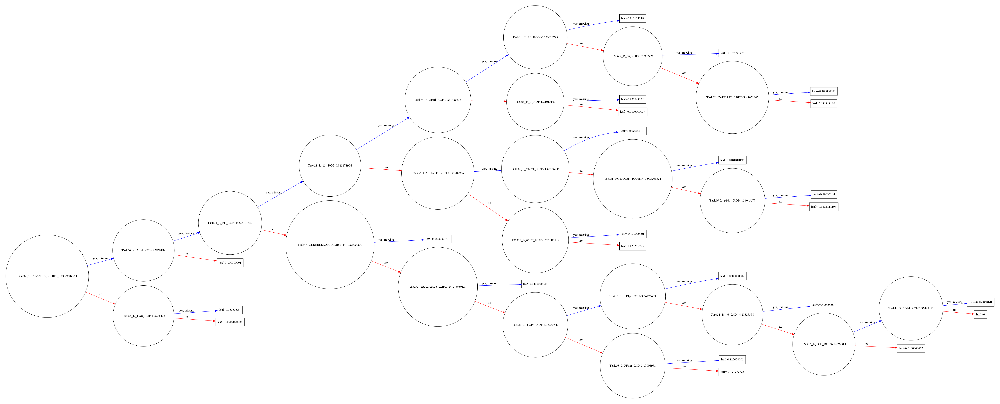

In [12]:
from xgboost import plot_tree
from matplotlib.pylab import rcParams
plt.style.use('default')
rcParams['figure.dpi'] = 200

plot_tree(gs.best_estimator_, num_trees=0, rankdir='LR')
fig = plt.gcf()
fig.set_size_inches(26.5,19)
plt.show()

# SHAP

In [13]:
import shap
shap.initjs()

In [14]:
explainer = shap.TreeExplainer(gs.best_estimator_)
shap_values = explainer.shap_values(X)

X_display, y_display = X, y

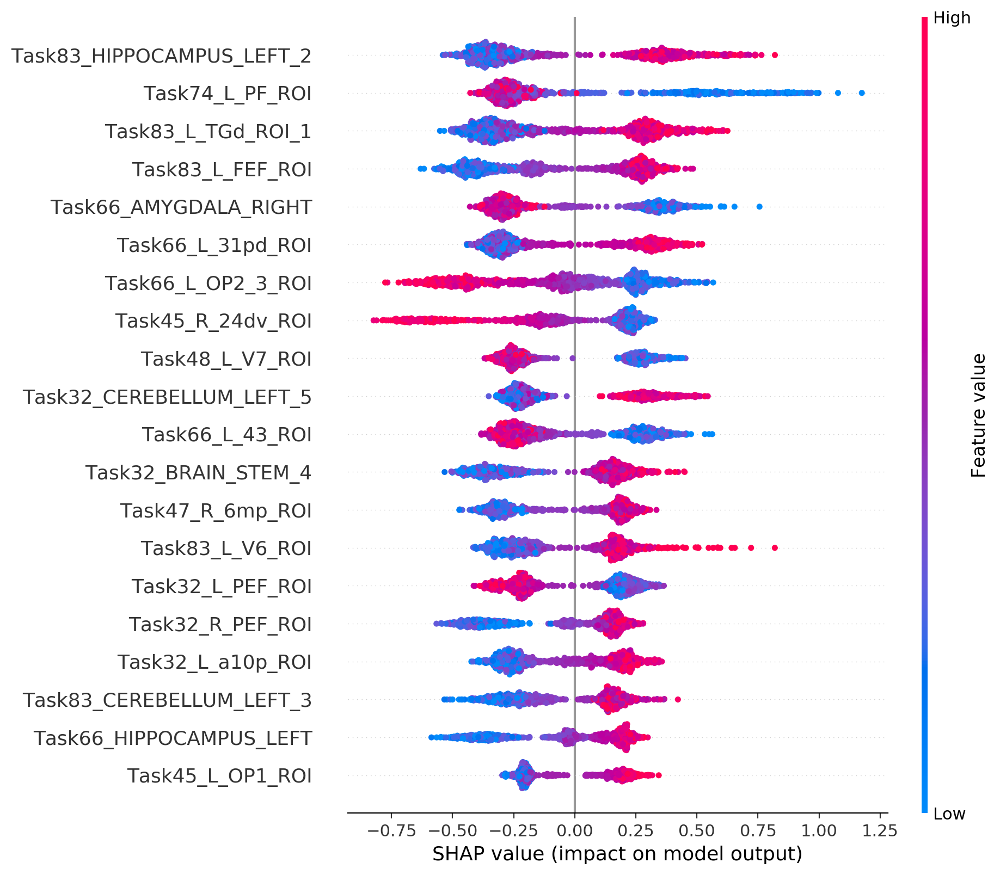

In [15]:
rcParams['figure.dpi'] = 120
plt.style.use('default')

shap.summary_plot(shap_values, X_display)

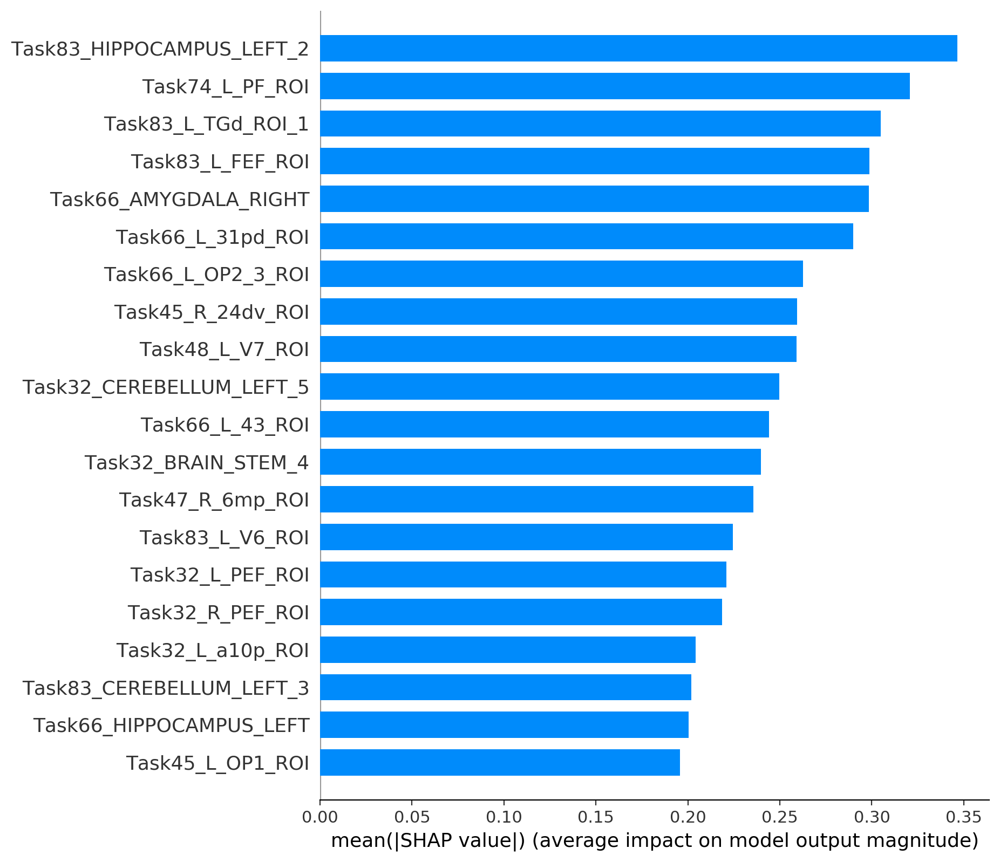

In [16]:
shap.summary_plot(shap_values, X_display, plot_type='bar')

# SHAP dependence plots
# top 20

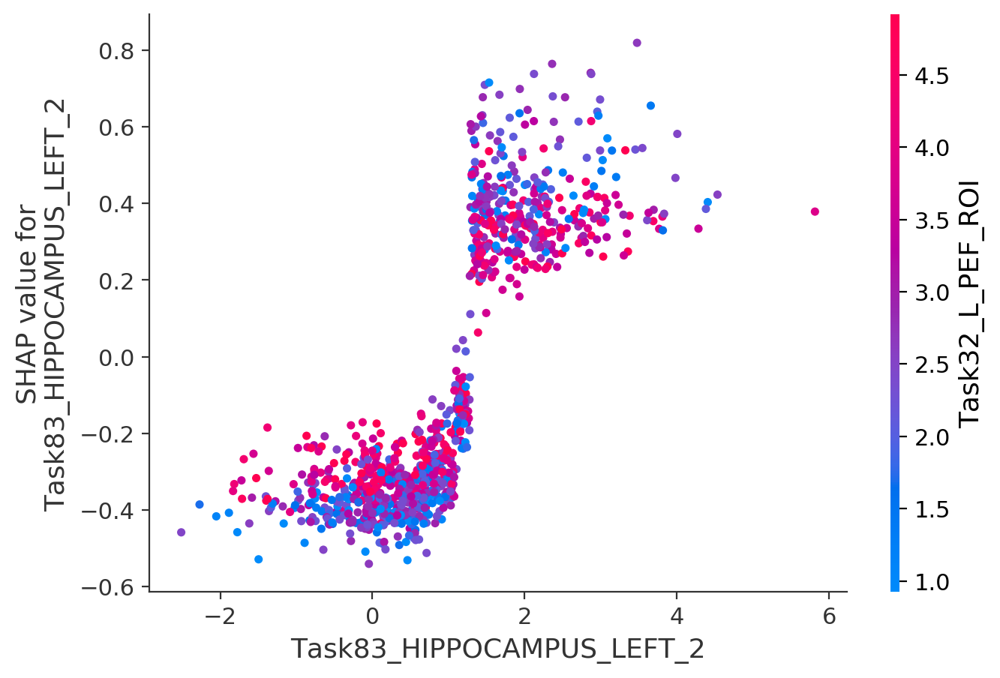

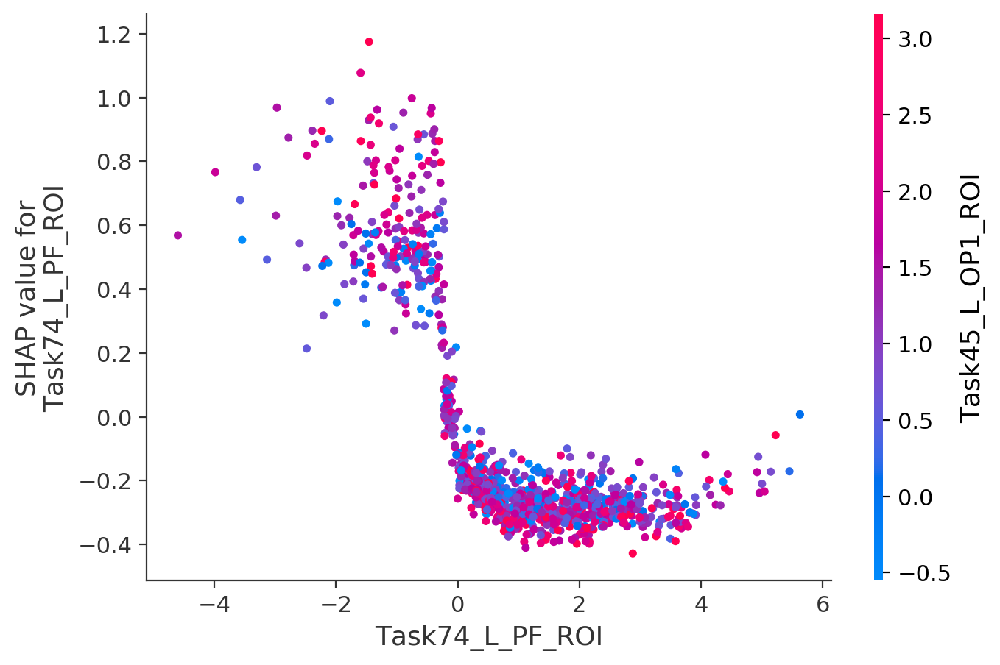

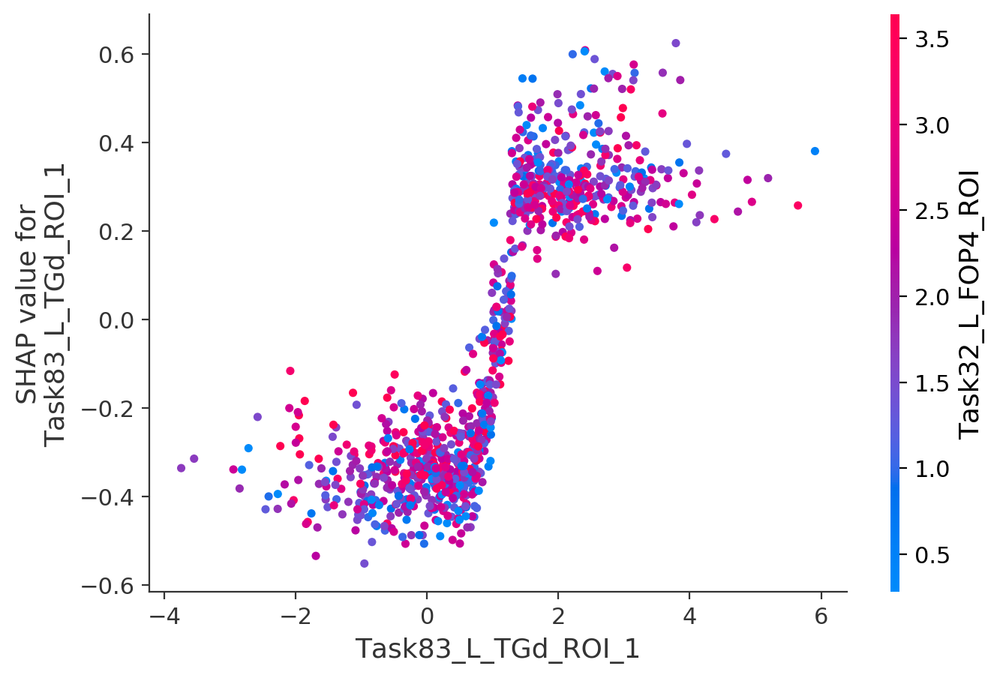

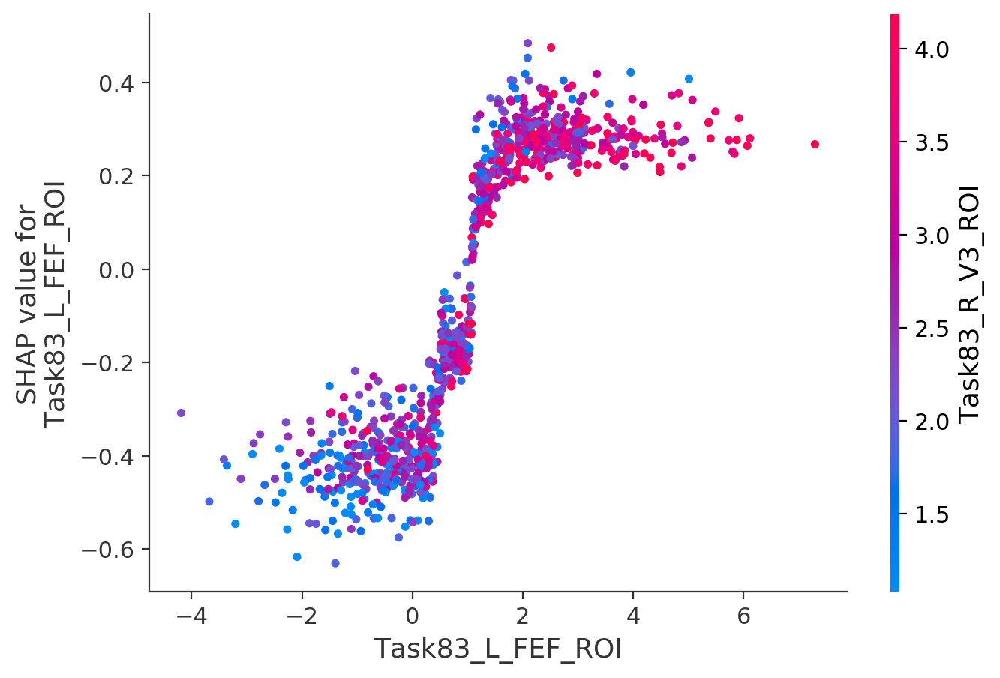

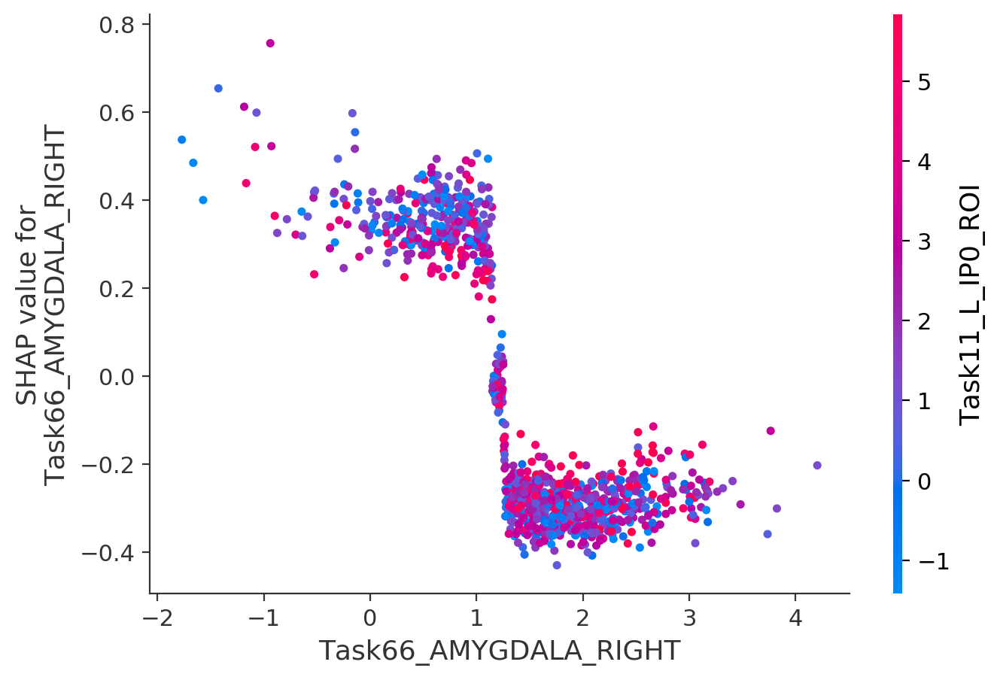

...

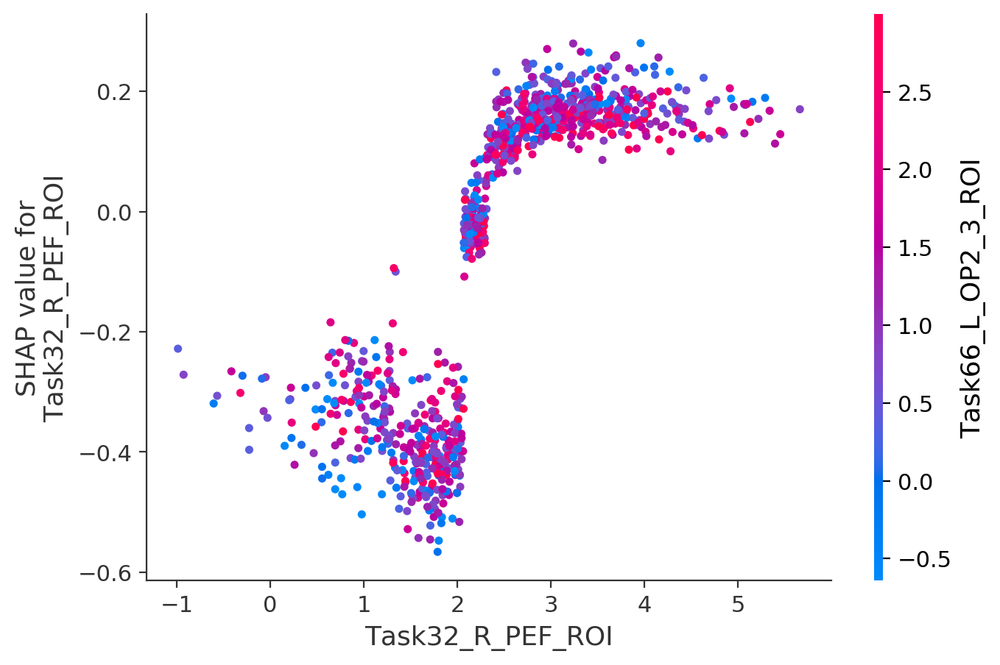

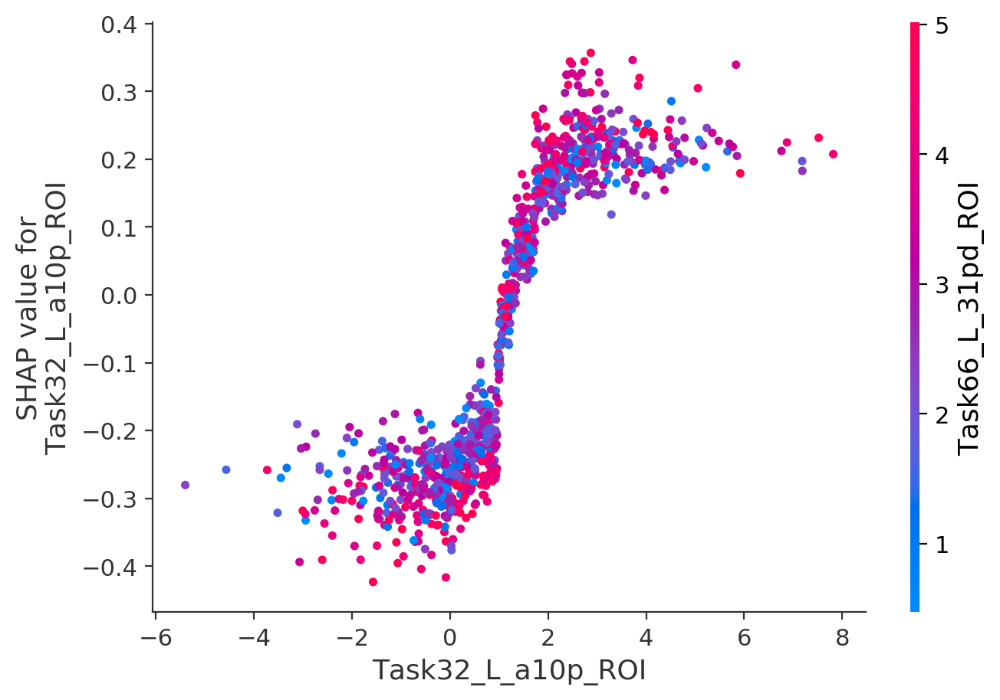

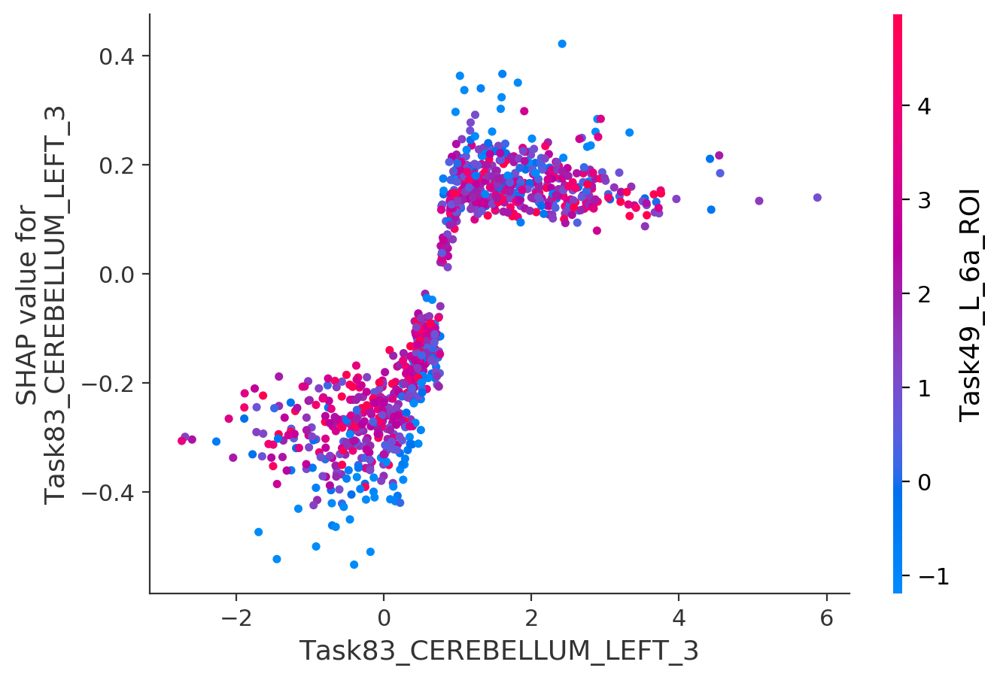

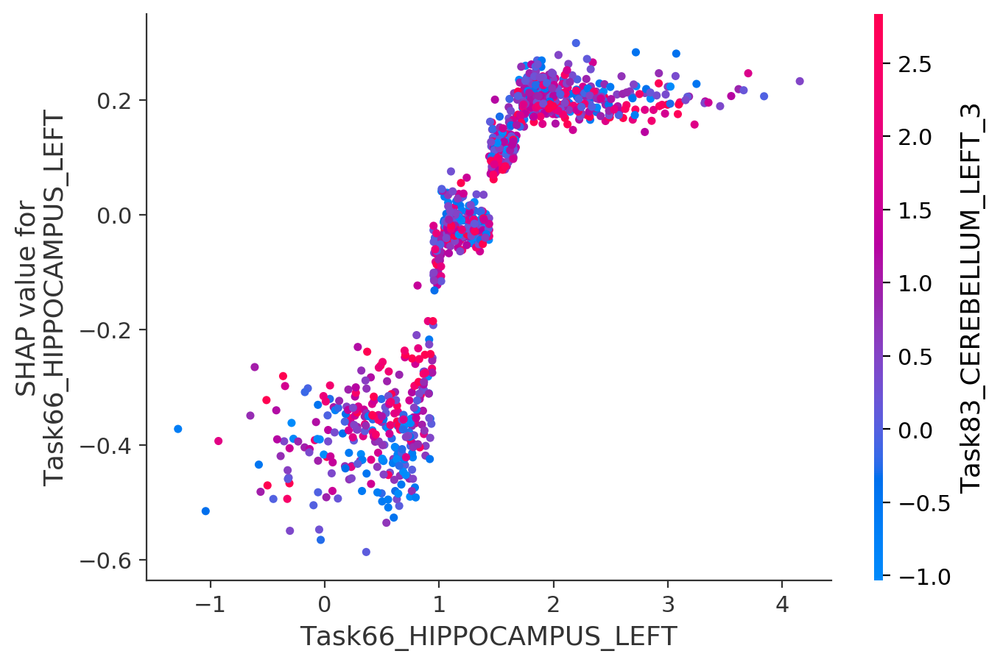

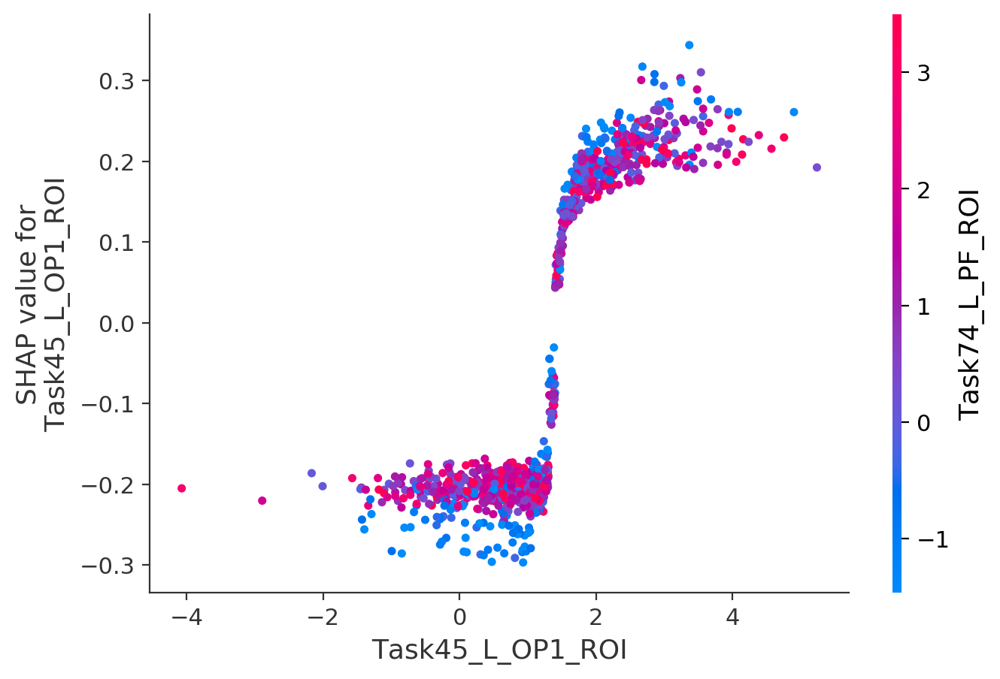

In [17]:
top_inds = np.argsort(-np.sum(np.abs(shap_values), 0))
for i in range(20):
    shap.dependence_plot(
        top_inds[i], 
        shap_values, 
        X, 
        display_features=X_display
    )

# SHAP interaction values

In [18]:
shap_interaction_values = shap.TreeExplainer(gs.best_estimator_).shap_interaction_values(X)
joblib.dump(shap_interaction_values, 'hcp_times_binary100x_shap_interaction_values_task_brain.pkl')

['hcp_times_binary100x_shap_interaction_values_task_brain.pkl']

# SHAP main effect value plots
# top 20

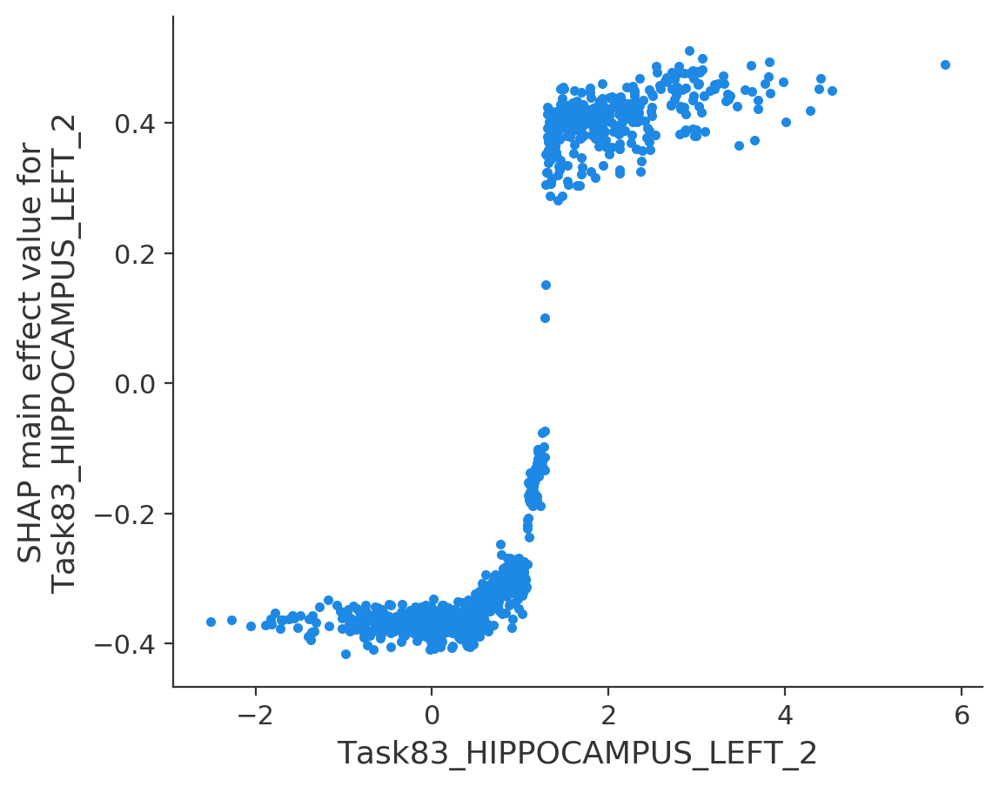

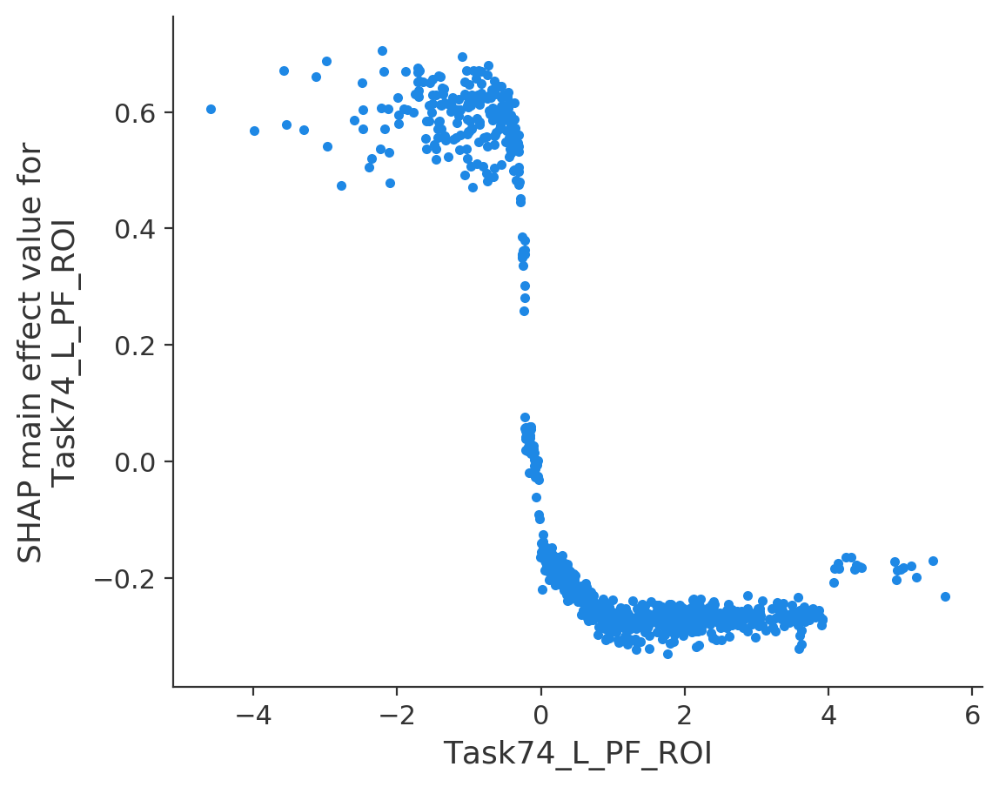

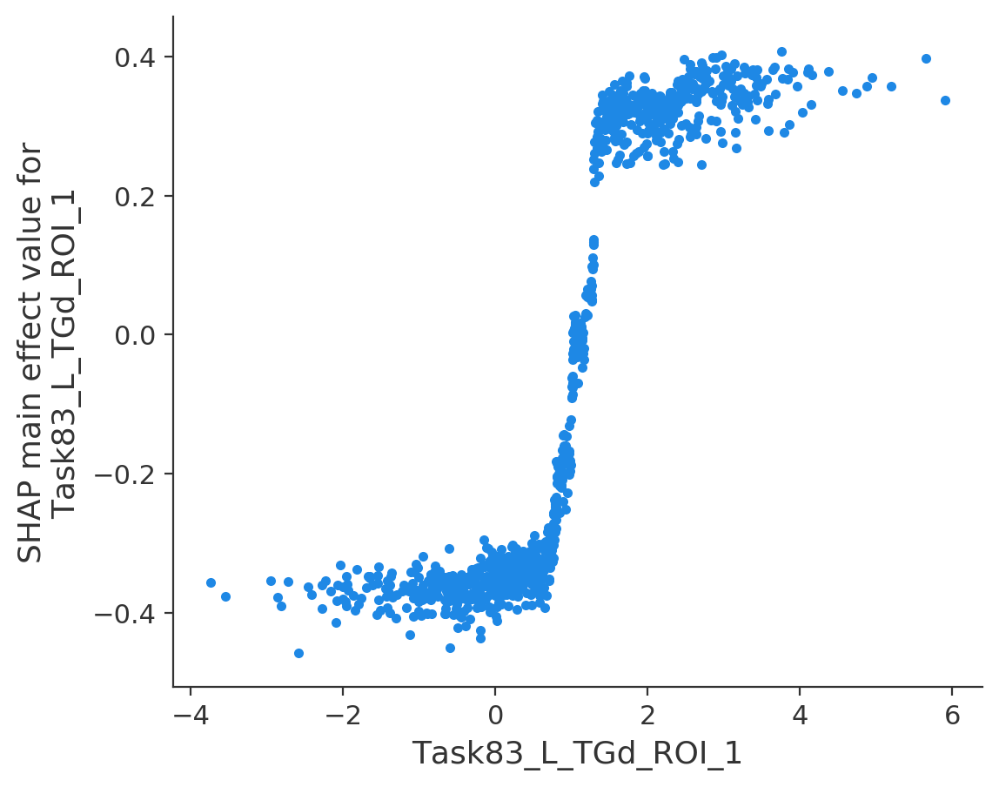

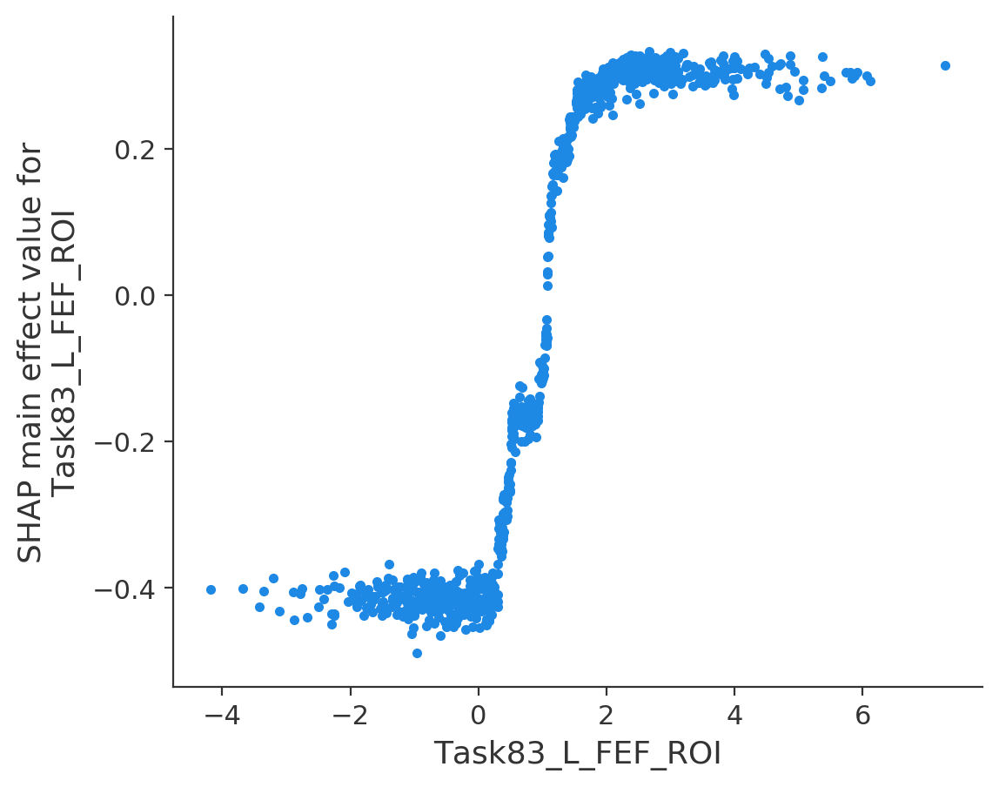

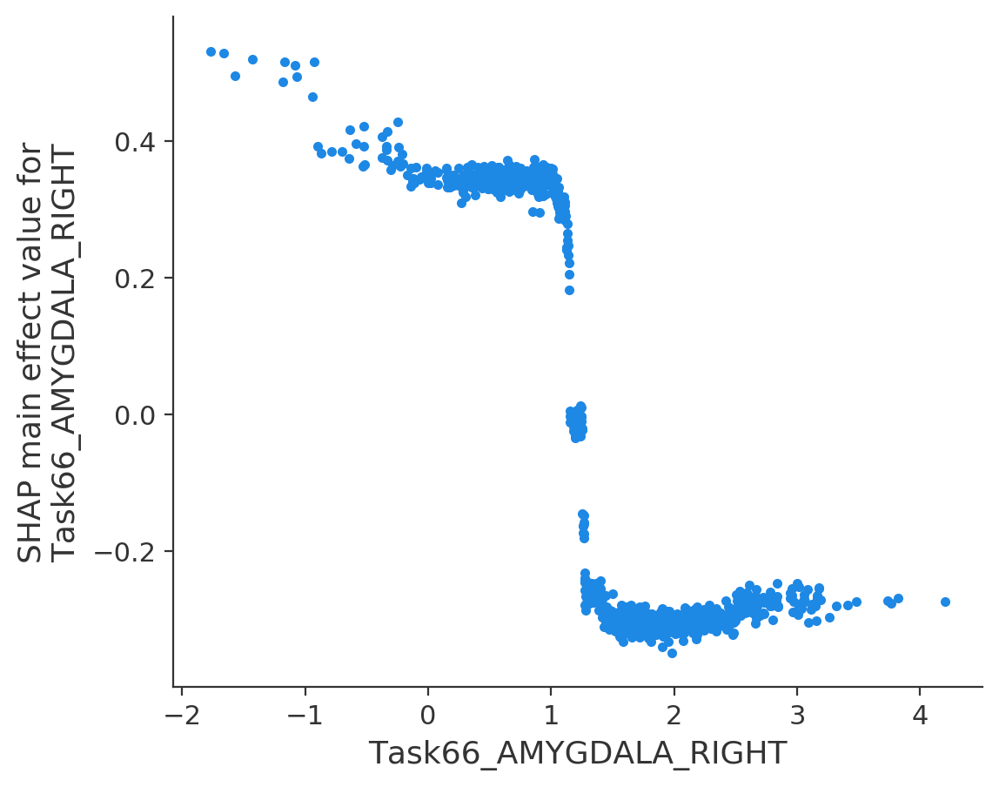

...

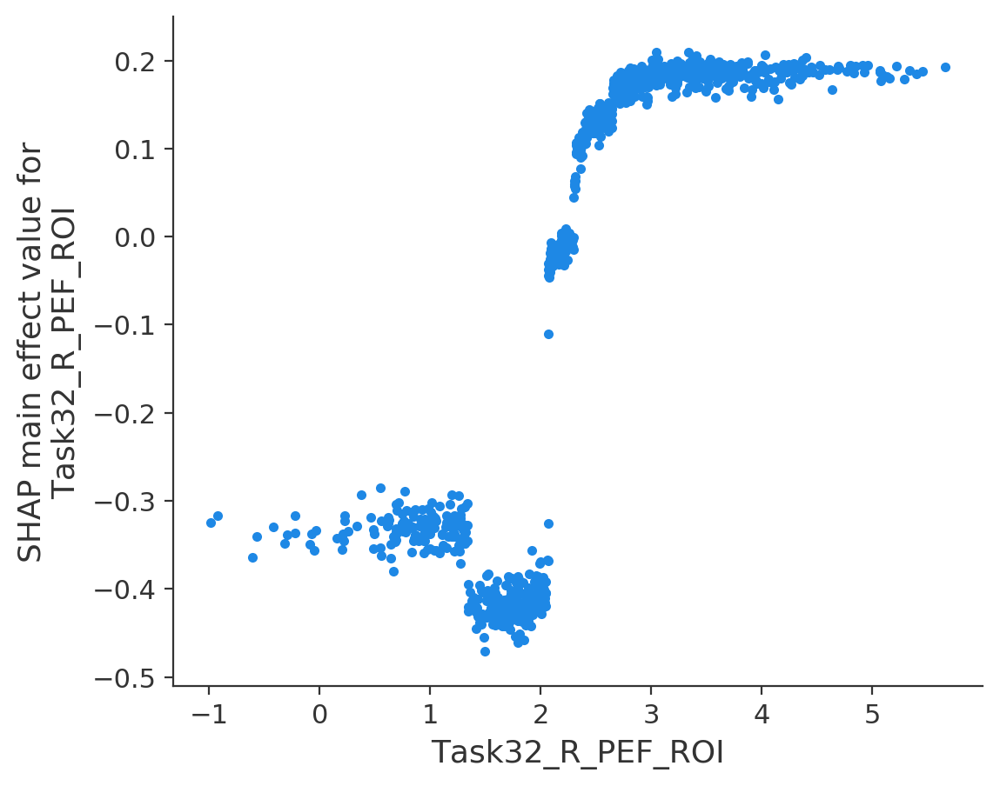

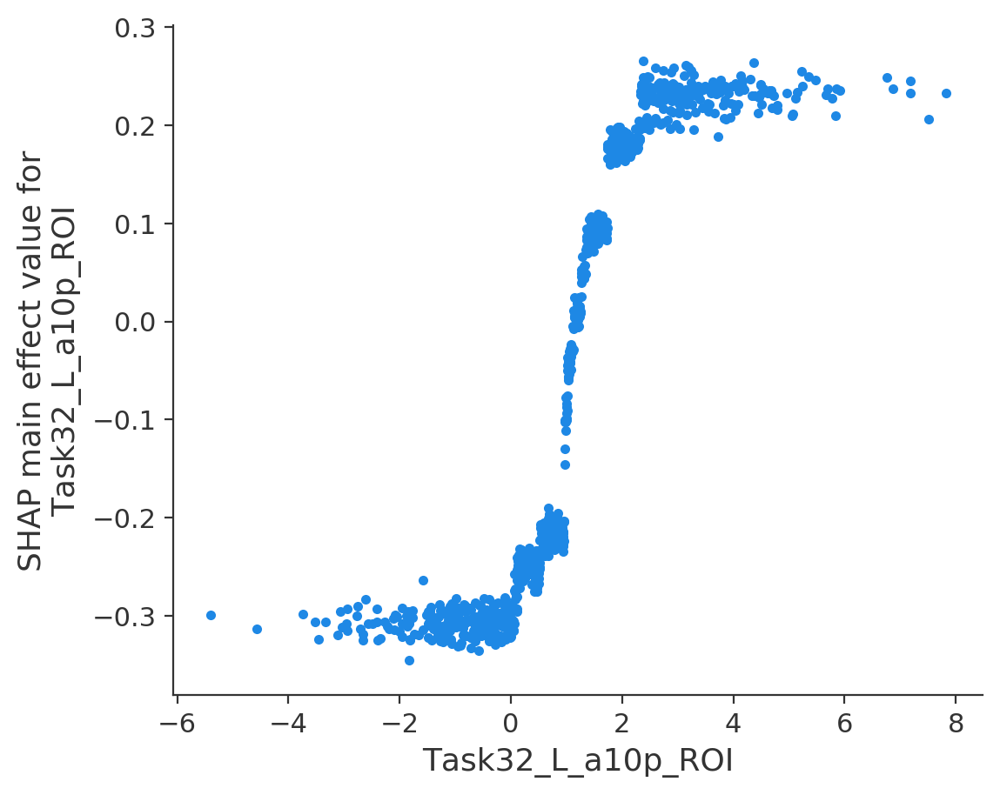

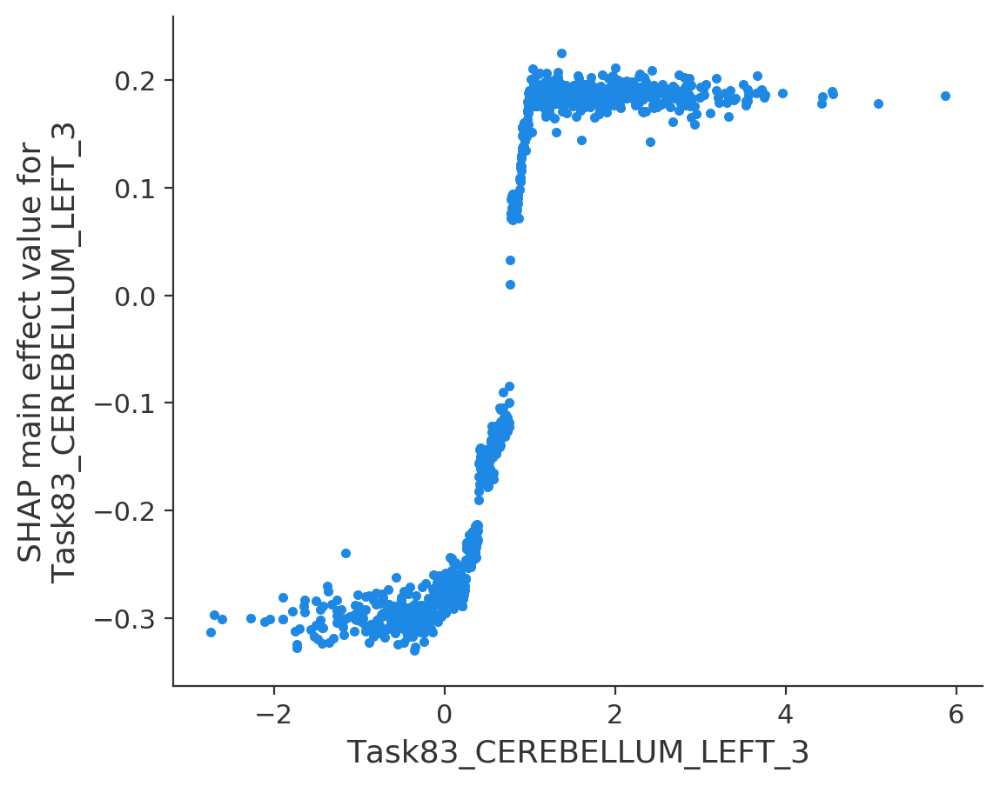

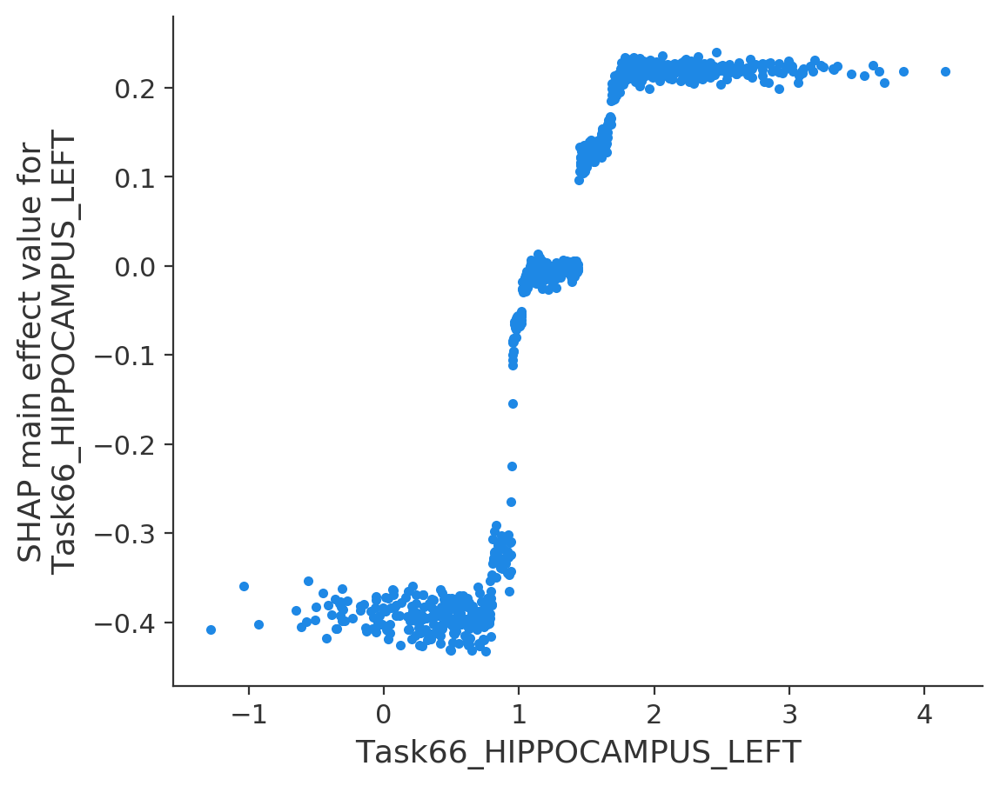

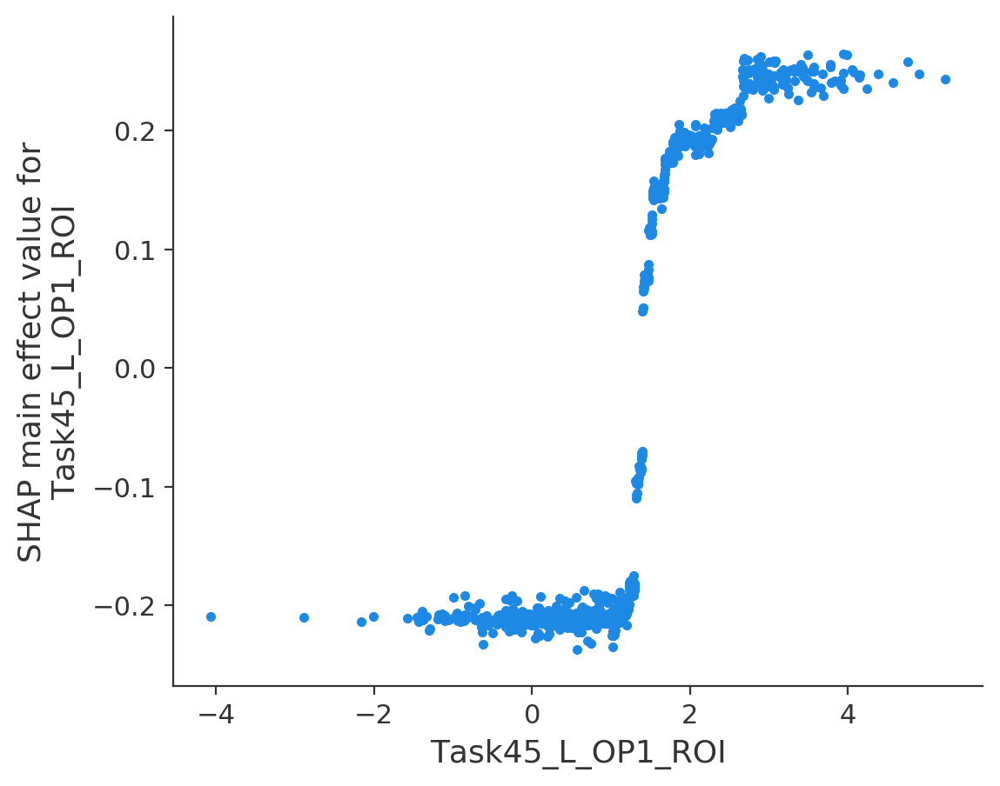

In [19]:
for i in range(20):
    shap.dependence_plot(
        (top_inds[i], top_inds[i]),
        shap_interaction_values, 
        X
    )

# SHAP interaction value plots
# top 20

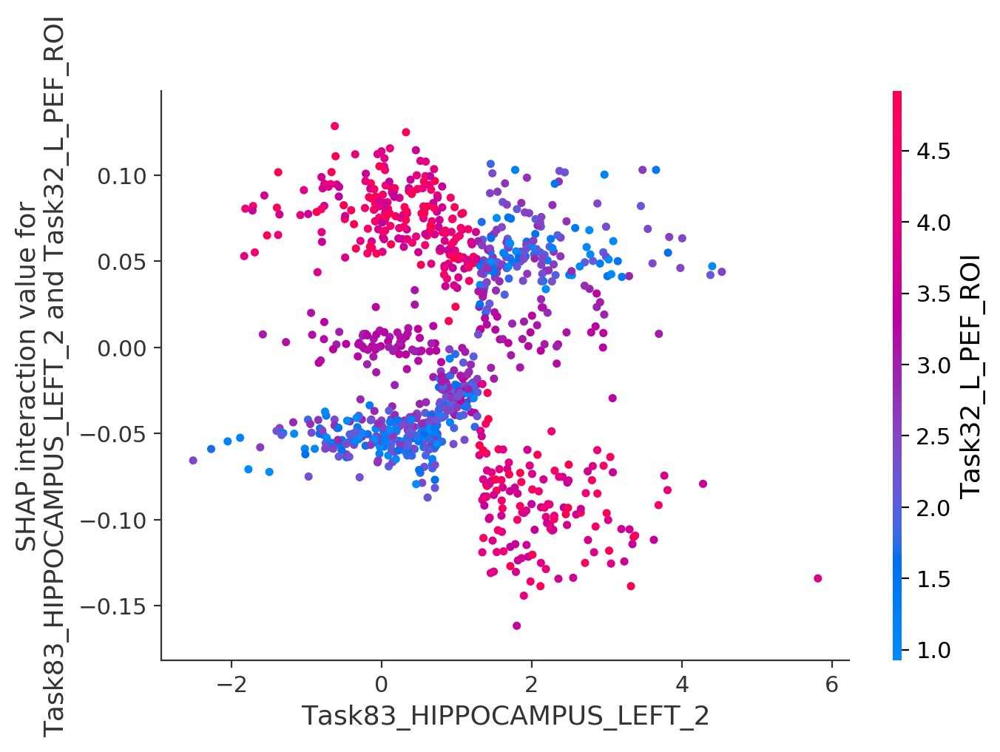

In [20]:
shap.dependence_plot(
    ('Task83_HIPPOCAMPUS_LEFT_2', 'Task32_L_PEF_ROI'),
    shap_interaction_values, 
    X
)

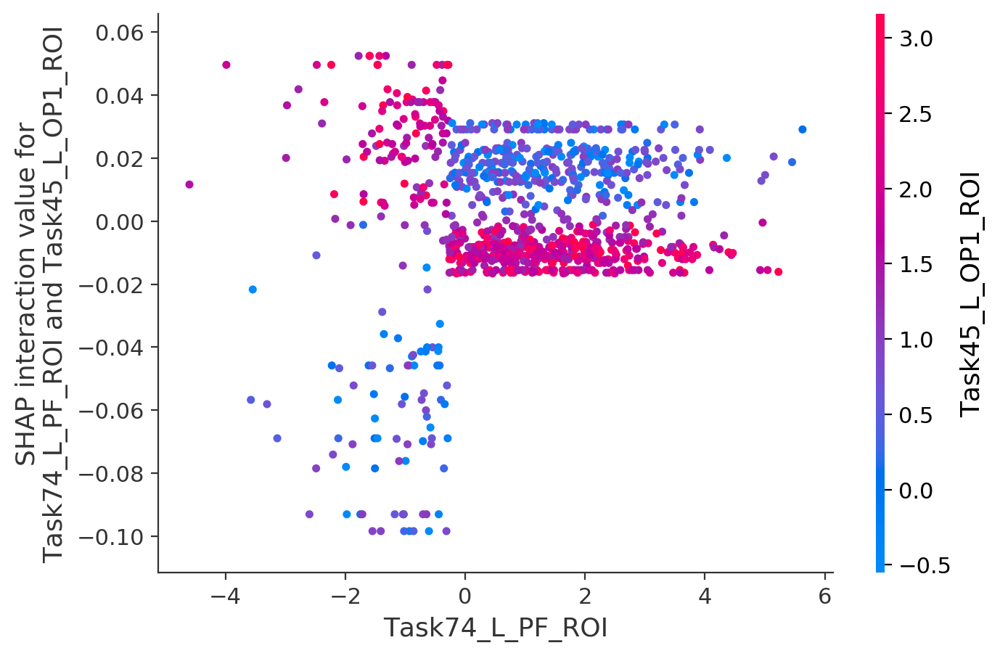

In [21]:
shap.dependence_plot(
    ('Task74_L_PF_ROI', 'Task45_L_OP1_ROI'),
    shap_interaction_values, 
    X
)

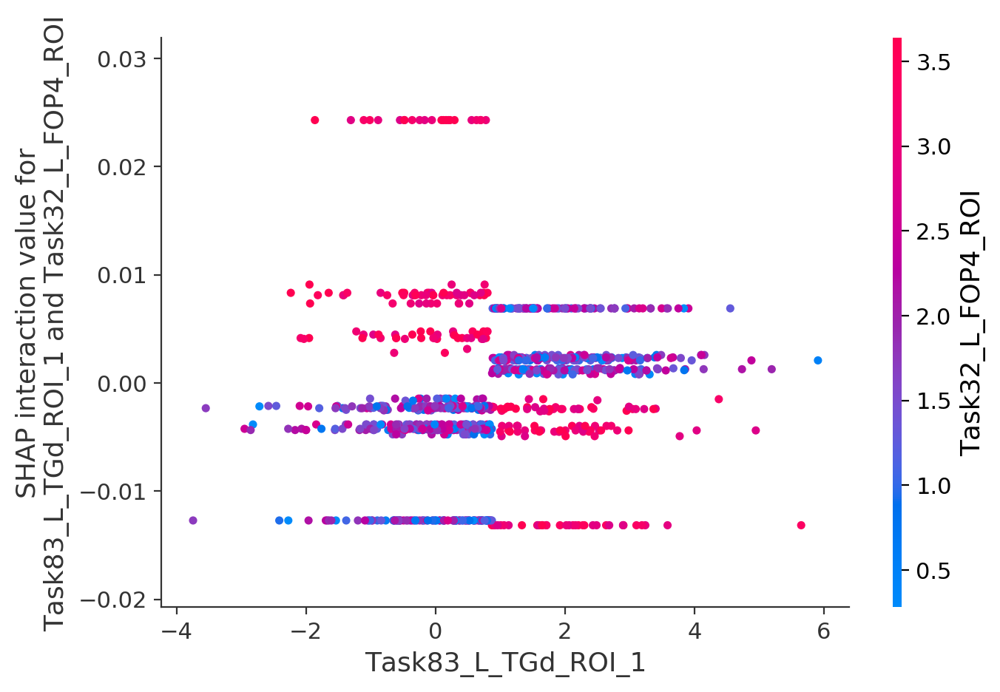

In [22]:
shap.dependence_plot(
    ('Task83_L_TGd_ROI_1', 'Task32_L_FOP4_ROI'),
    shap_interaction_values, 
    X
)

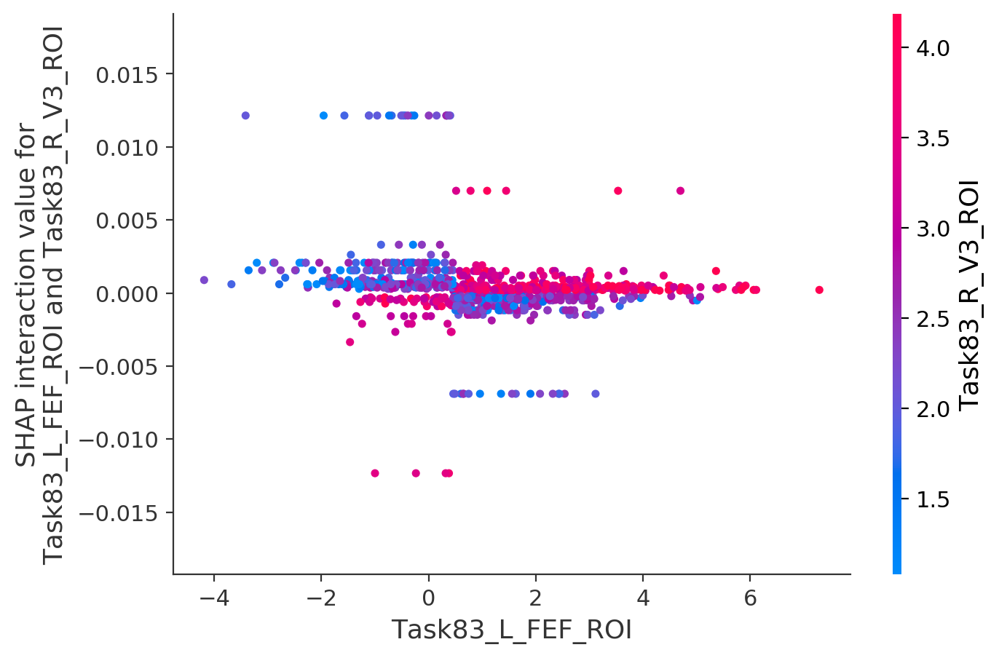

In [23]:
shap.dependence_plot(
    ('Task83_L_FEF_ROI', 'Task83_R_V3_ROI'),
    shap_interaction_values, 
    X
)

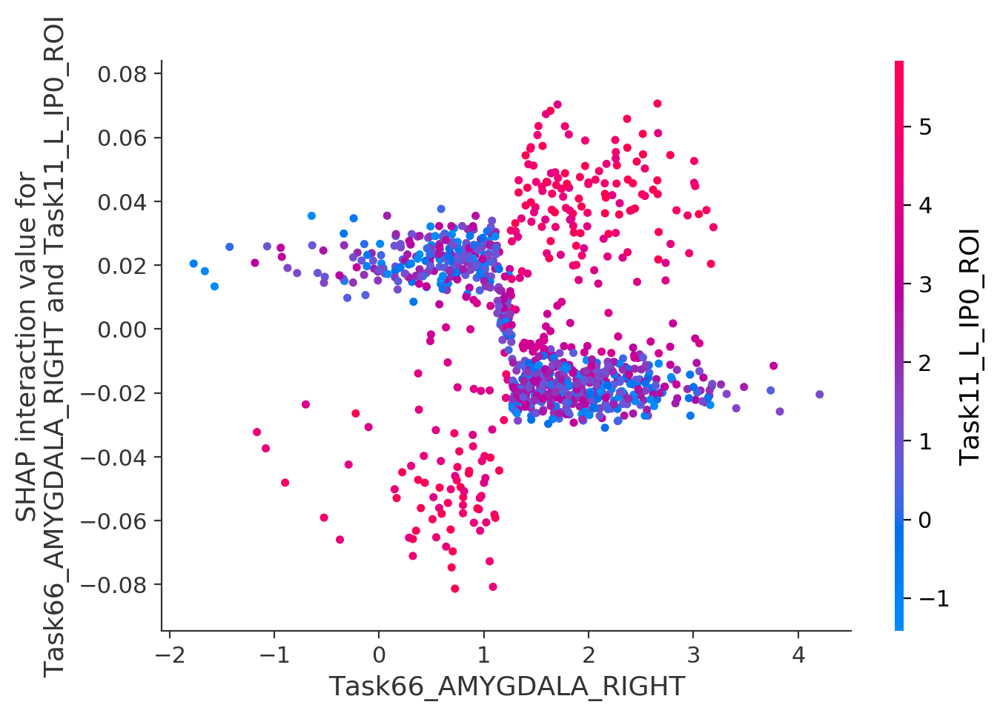

In [24]:
shap.dependence_plot(
    ('Task66_AMYGDALA_RIGHT', 'Task11_L_IP0_ROI'),
    shap_interaction_values, 
    X
)

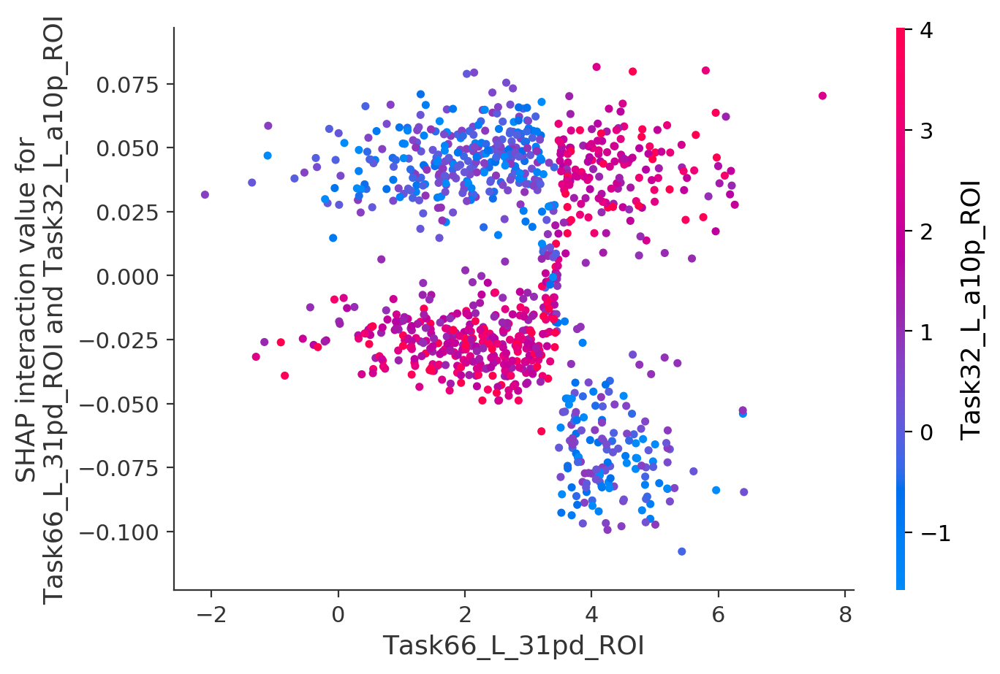

In [25]:
shap.dependence_plot(
    ('Task66_L_31pd_ROI', 'Task32_L_a10p_ROI'),
    shap_interaction_values, 
    X
)

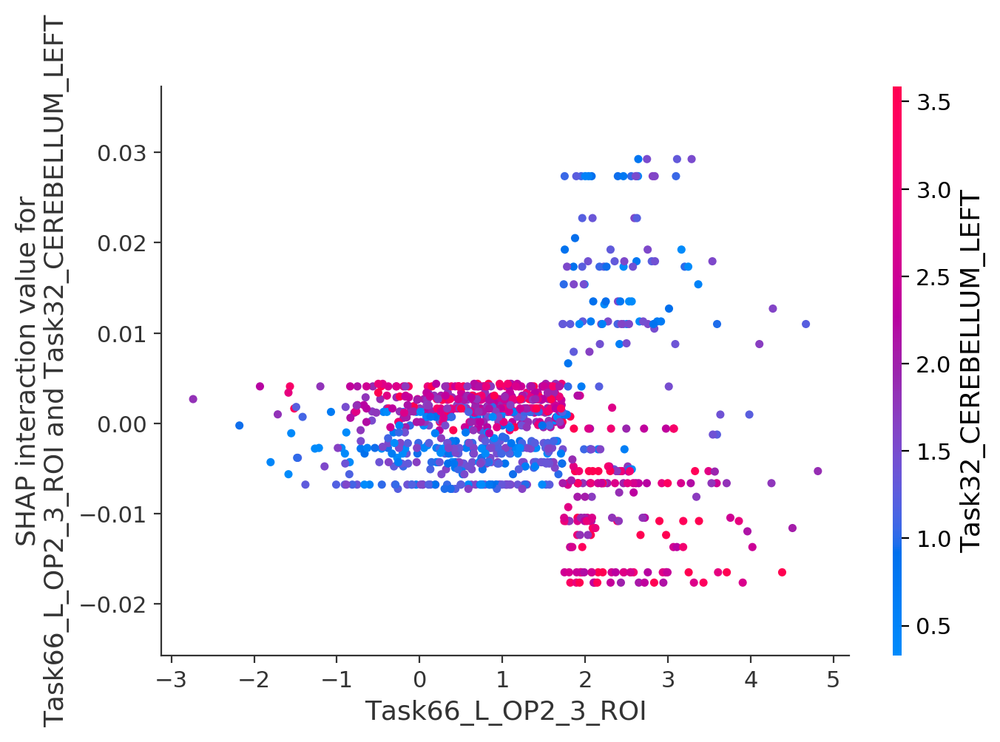

In [26]:
shap.dependence_plot(
    ('Task66_L_OP2_3_ROI', 'Task32_CEREBELLUM_LEFT'),
    shap_interaction_values, 
    X
)

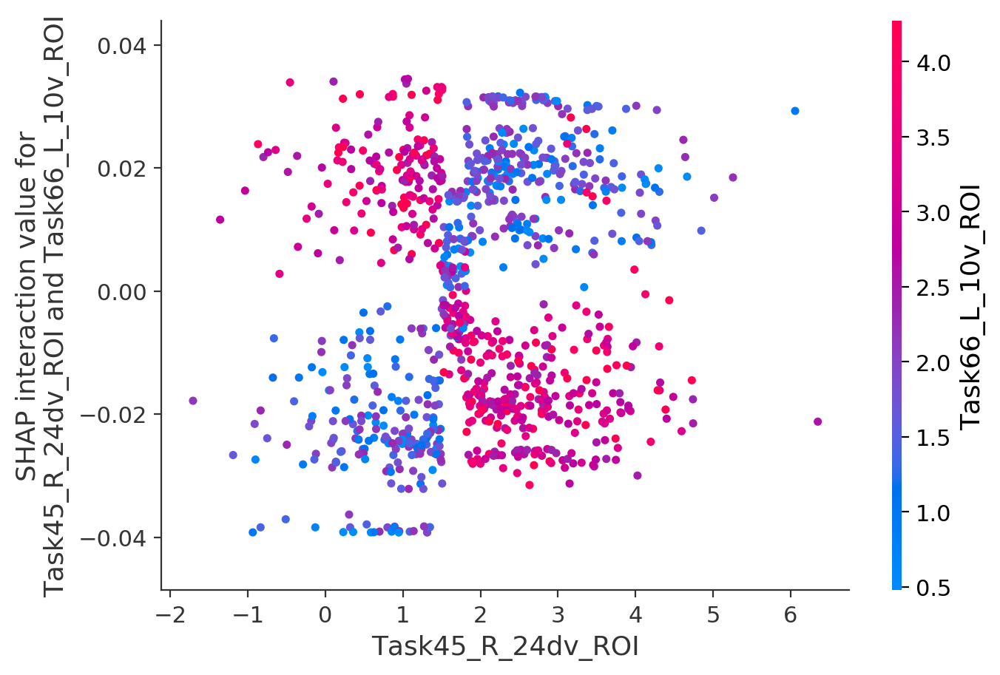

In [27]:
shap.dependence_plot(
    ('Task45_R_24dv_ROI', 'Task66_L_10v_ROI'),
    shap_interaction_values, 
    X
)

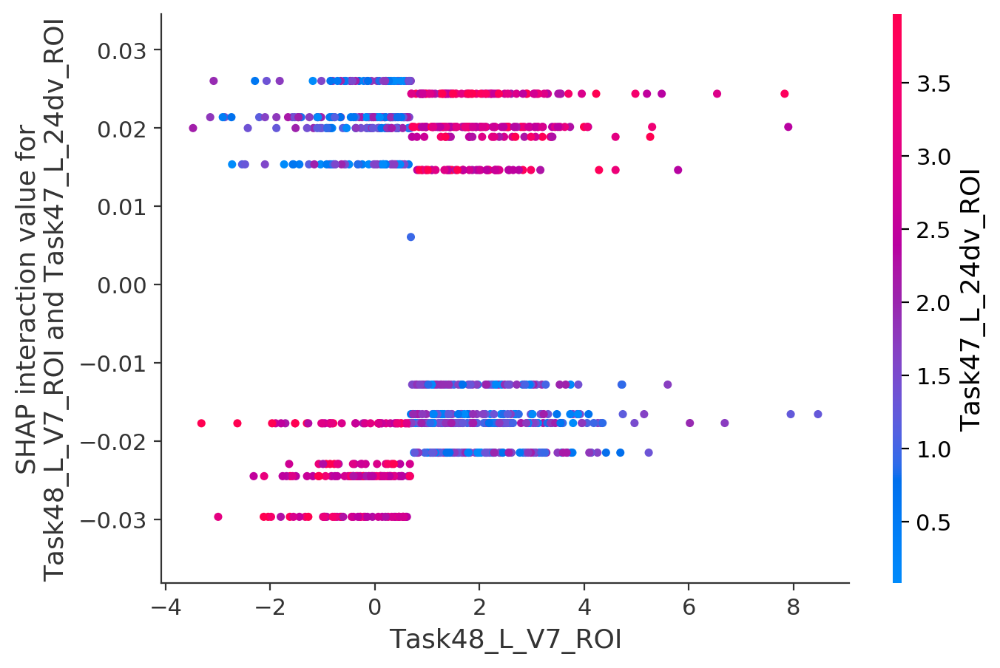

In [28]:
shap.dependence_plot(
    ('Task48_L_V7_ROI', 'Task47_L_24dv_ROI'),
    shap_interaction_values, 
    X
)

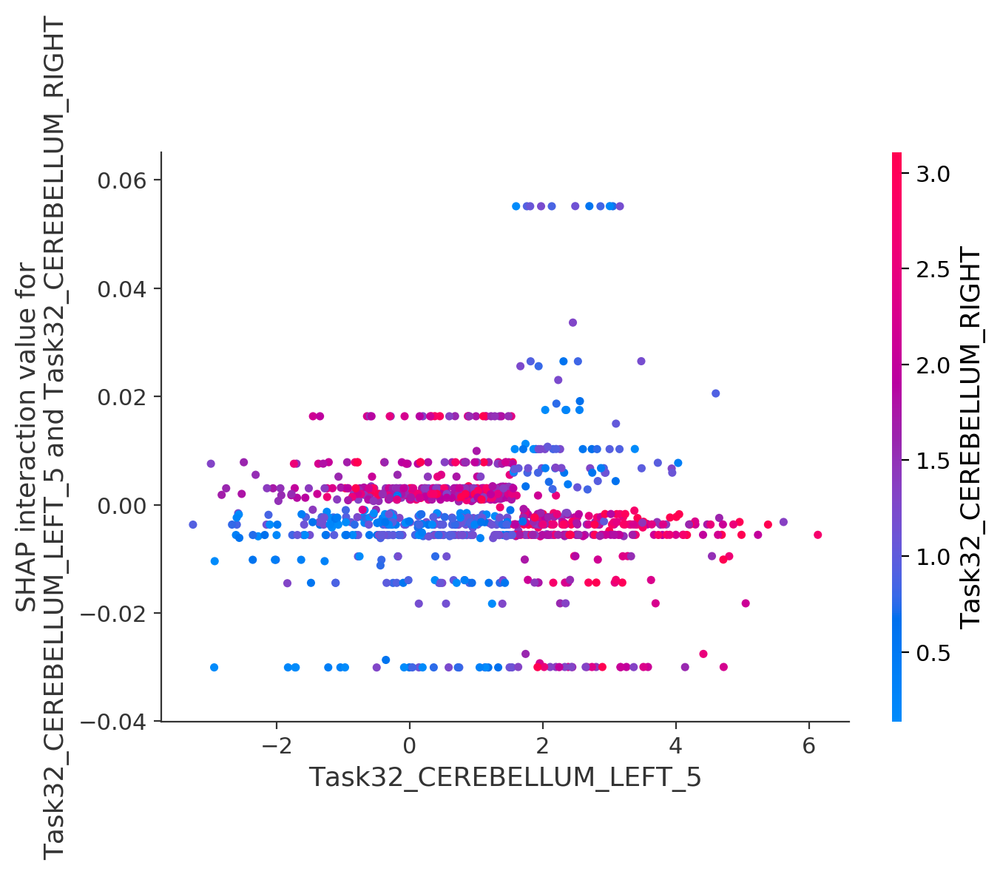

In [29]:
shap.dependence_plot(
    ('Task32_CEREBELLUM_LEFT_5', 'Task32_CEREBELLUM_RIGHT'),
    shap_interaction_values, 
    X
)

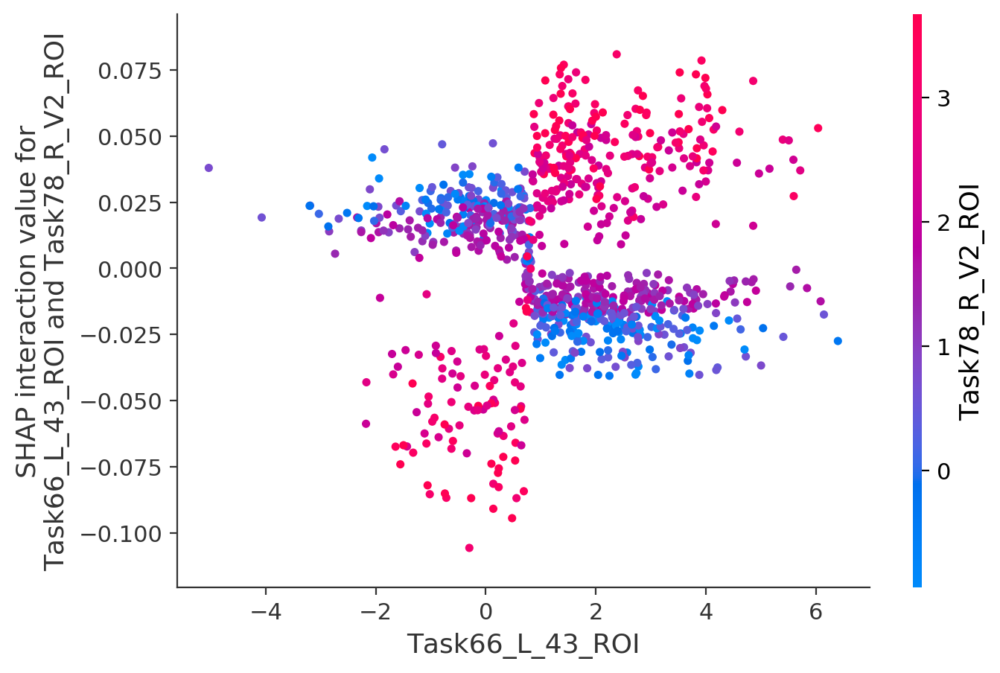

In [30]:
shap.dependence_plot(
    ('Task66_L_43_ROI', 'Task78_R_V2_ROI'),
    shap_interaction_values, 
    X
)

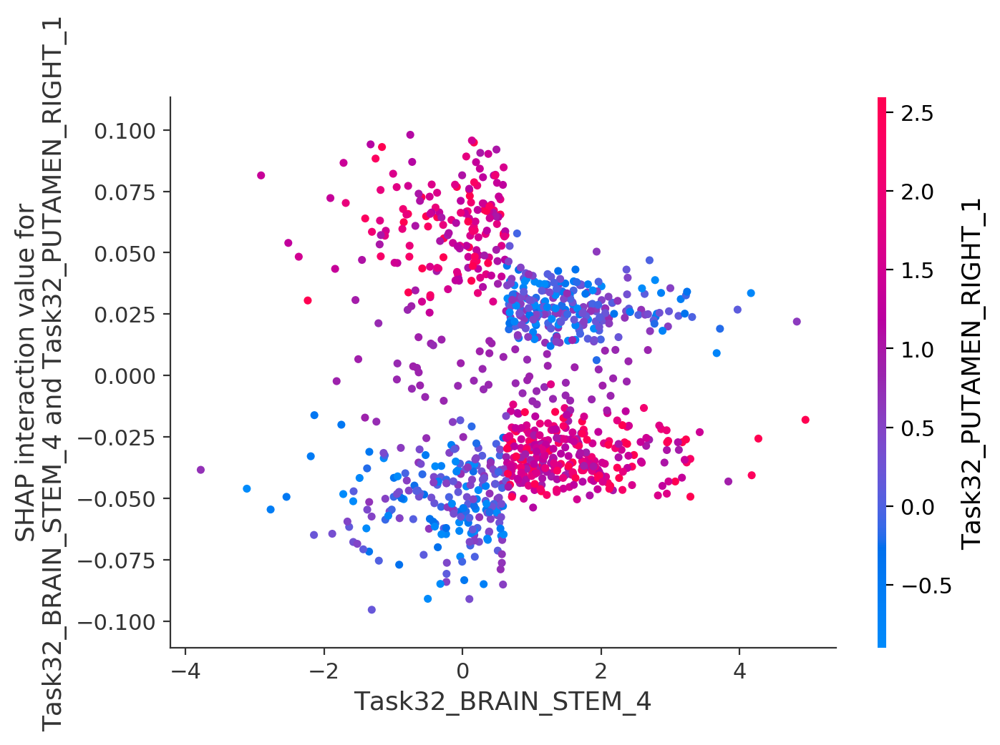

In [31]:
shap.dependence_plot(
    ('Task32_BRAIN_STEM_4', 'Task32_PUTAMEN_RIGHT_1'),
    shap_interaction_values, 
    X
)

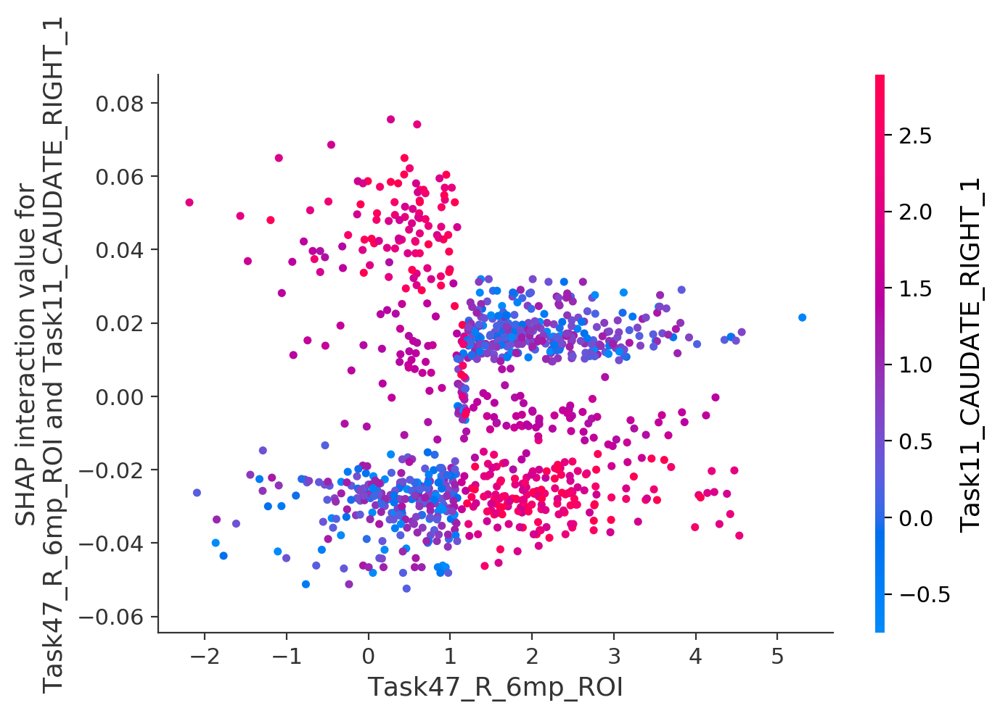

In [32]:
shap.dependence_plot(
    ('Task47_R_6mp_ROI', 'Task11_CAUDATE_RIGHT_1'),
    shap_interaction_values, 
    X
)

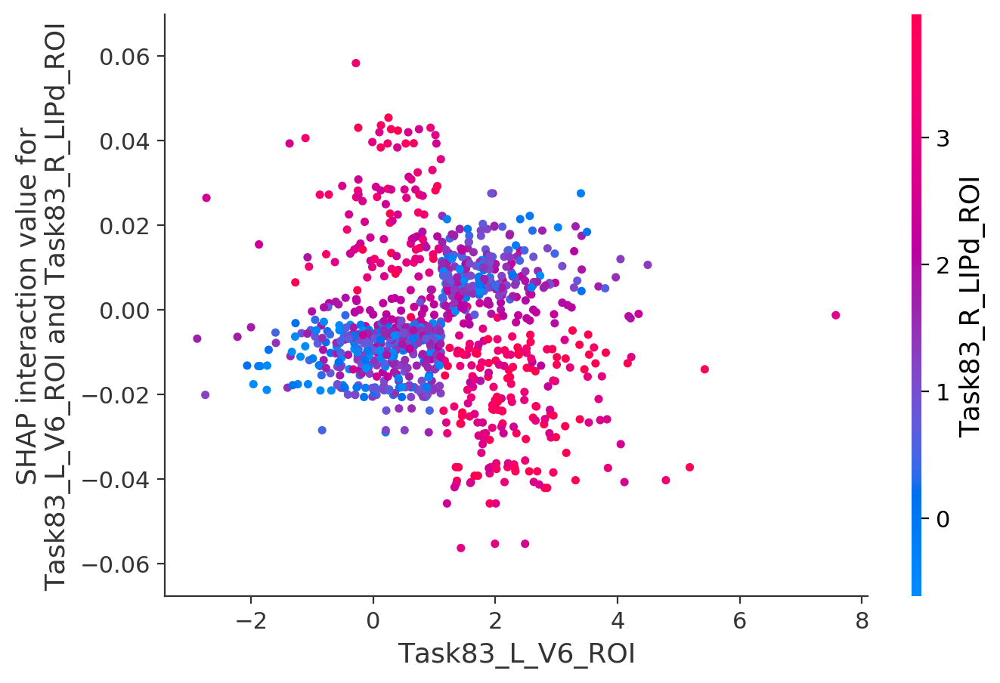

In [33]:
shap.dependence_plot(
    ('Task83_L_V6_ROI', 'Task83_R_LIPd_ROI'),
    shap_interaction_values, 
    X
)

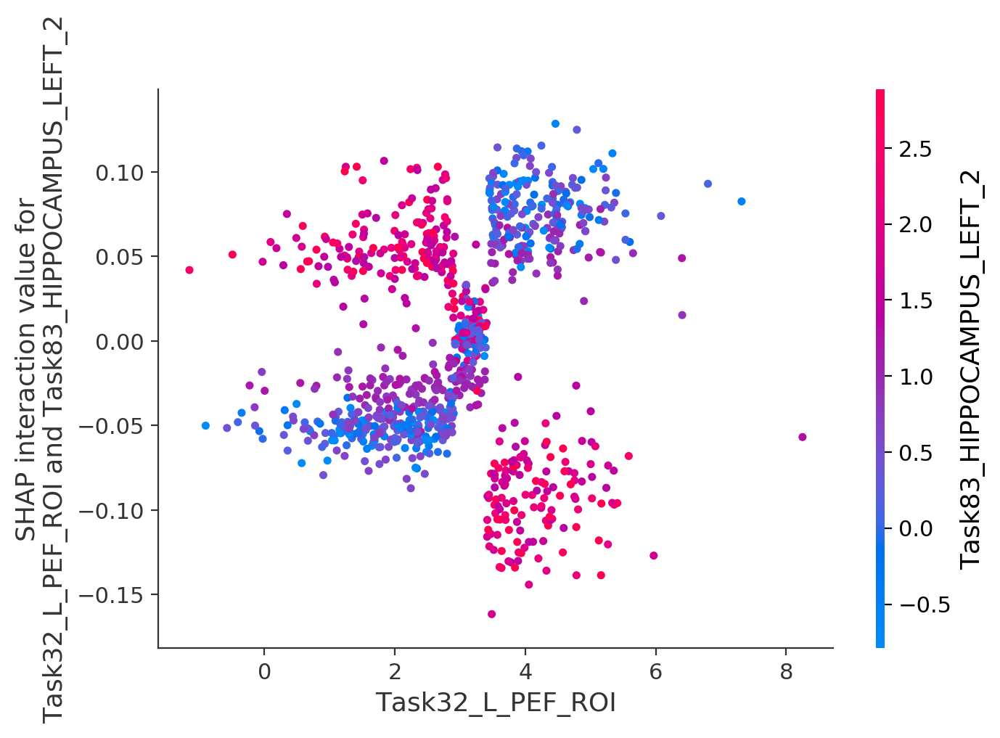

In [34]:
shap.dependence_plot(
    ('Task32_L_PEF_ROI', 'Task83_HIPPOCAMPUS_LEFT_2'),
    shap_interaction_values, 
    X
)

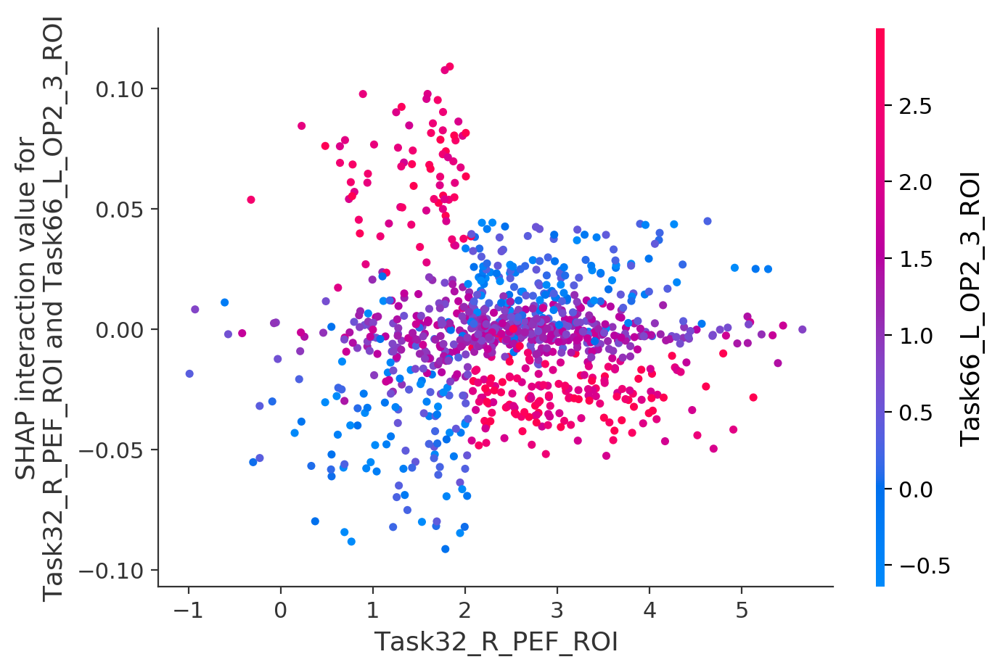

In [35]:
shap.dependence_plot(
    ('Task32_R_PEF_ROI', 'Task66_L_OP2_3_ROI'),
    shap_interaction_values, 
    X
)

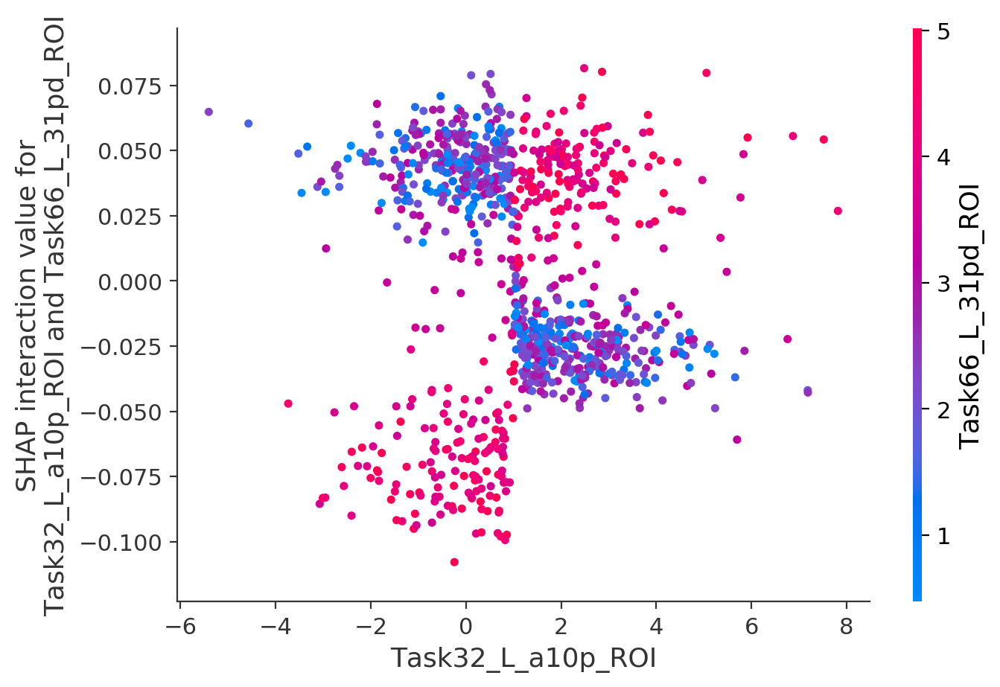

In [36]:
shap.dependence_plot(
    ('Task32_L_a10p_ROI', 'Task66_L_31pd_ROI'),
    shap_interaction_values, 
    X
)

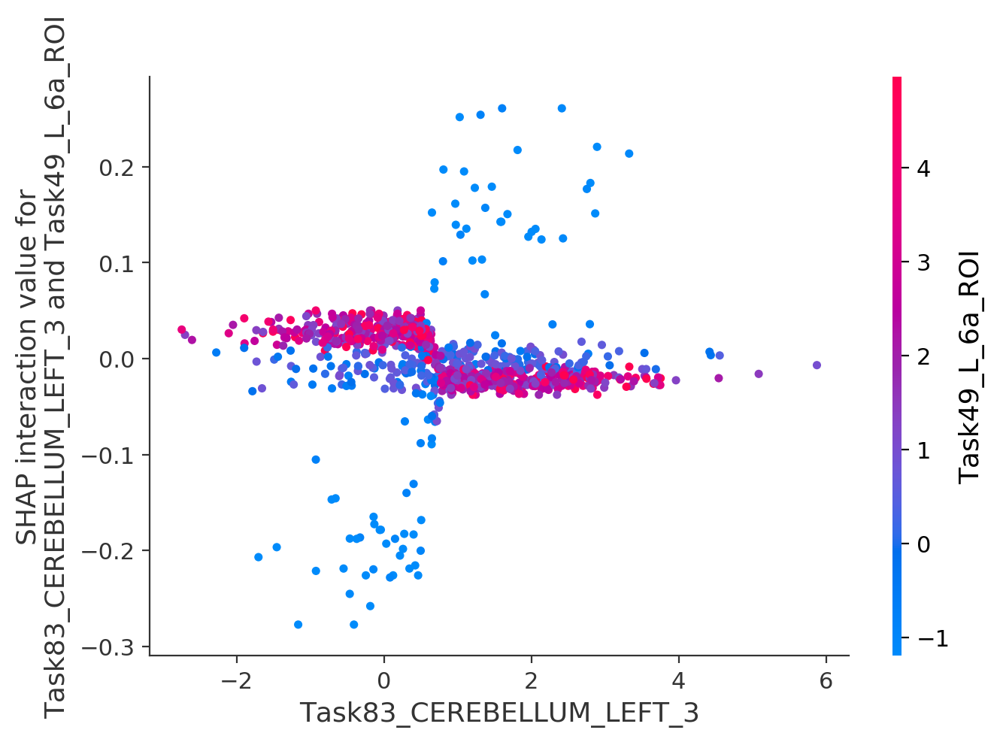

In [37]:
shap.dependence_plot(
    ('Task83_CEREBELLUM_LEFT_3', 'Task49_L_6a_ROI'),
    shap_interaction_values, 
    X
)

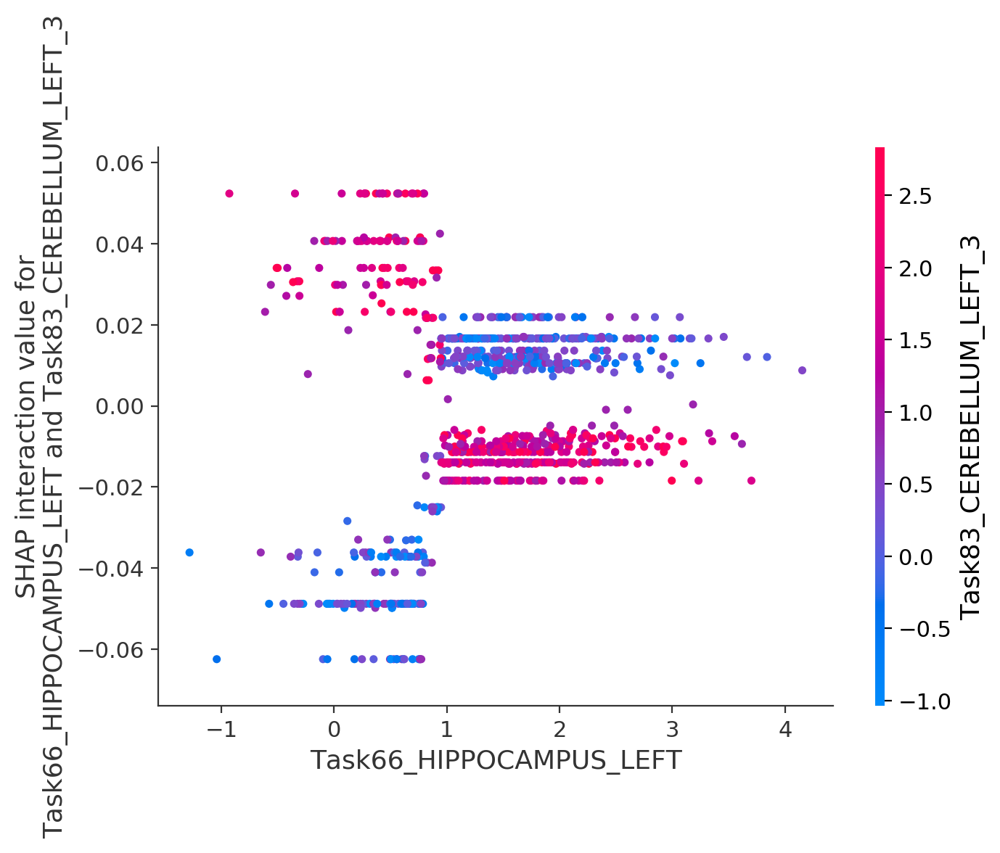

In [38]:
shap.dependence_plot(
    ('Task66_HIPPOCAMPUS_LEFT', 'Task83_CEREBELLUM_LEFT_3'),
    shap_interaction_values, 
    X
)

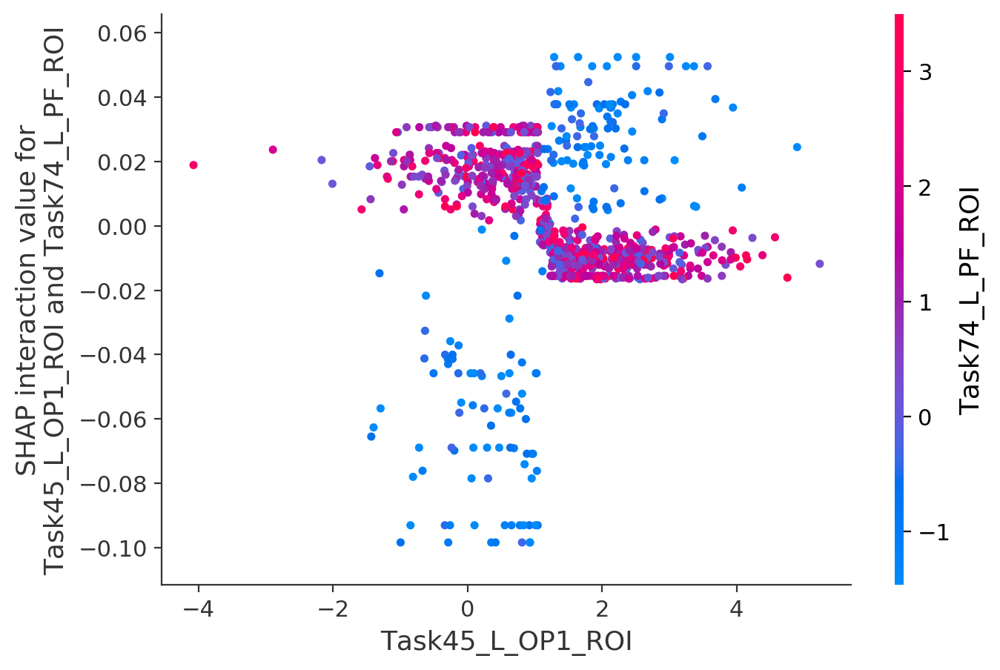

In [39]:
shap.dependence_plot(
    ('Task45_L_OP1_ROI', 'Task74_L_PF_ROI'),
    shap_interaction_values, 
    X
)